# **Preprocessing eeg Data**

***

In this notebook, EEG pre-processing has been divided into the following 7 steps:

- **Step 1: Loading Data**  
- **Step 2: Filtering Data**  
- **Step 3: Rejecting Artifacts**  
- **Step 4: Setting the Reference**  
- **Step 5: Segmenting Data into Epochs**  
- **Step 6: Data Averaging**  
- **Step 7: Time-Frequency Analysis**


# Step 1 Loading Data

### Reading Raw Data

Since MATLAB-based EEGLAB is the the most widely used EEG data analysis toolbox that most researchers are more familar with, here we use the classic dataset ('eeglab_data.set') in EEGLAB as an example to teach you how to use Python to deal with EEG data.

In [1]:
# !pip install mne

In [2]:
import numpy as np
import mne
from mne.preprocessing import ICA
from mne.time_frequency import tfr_morlet
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')
plt.rcParams["figure.dpi"] = 150

%matplotlib inline

# Download the sample_data

data_dir = r"data/sub-001/eeg/"

filename = r'sub-001_task-eyesclosed_eeg.set'
data_path = data_dir + filename

# About data path
# - If dataset has been downloaded in the sample_data folder of the EEGLAB folder,
# navigate to your Downloads directory
# for example:
# data_path = "/Users/zitonglu/Desktop/EEG/eeglab14_1_2b/sample_data/eeglab_data.set"

# Multiple formats of EEG data are supported in MNE-Python:

# *** If the data suffix is '.set '(Data from EEGLAB)
#     use mne.io.read_raw_eeglab()
# *** If the data suffix is '.vhdr' (BrainVision)
#     use mne.io.read_raw_brainvision()
# *** If the data suffix is '.edf'
#     use mne.io.read_raw_edf()
# *** If the data suffix is '.bdf' (BioSemi)
#     use mne.io.read_raw_bdf()
# *** If the data suffix is '.gdf'
#     use mne.io.read_raw_gdf()
# *** If the data suffix is '.cnt' (Neuroscan)
#     use mne.io.read_raw_cnt()
# *** If the data suffix is '.egi' or '.mff'
#     use mne.io.read_raw_egi()
# *** If the data suffix is '.data'
#     use mne.io.read_raw_nicolet()
# *** If the data suffix is '.nxe' (Nexstim eXimia)
#     use mne.io.read_raw_eximia()
# *** If the data suffix is '.lay' or '.dat' (Persyst)
#     use mne.io.read_raw_persyst()
# *** If the data suffix is '.eeg' (Nihon Kohden)
#     use mne.io.read_raw_nihon()

# Reading data
raw = mne.io.read_raw_eeglab(data_path, preload=True)

### Checking Raw Data Information

In [3]:
print(raw)
print(raw.info)

<RawEEGLAB | sub-001_task-eyesclosed_eeg.set, 19 x 299900 (599.8 s), ~43.5 MiB, data loaded>
<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T3, T4, T5, ...
 chs: 19 EEG
 custom_ref_applied: False
 dig: 22 items (3 Cardinal, 19 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 500.0 Hz
>


We can get some basic and important information of the EEG data:
19 channels with 299900 time points; sampling rate is 500Hz; data length is 599.8 s; data size is about 43.5 MB.
Here, we set preload=True when we load the data, so the data is preloaded into memory.  
The names of channels are Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T3, T4, T5, ..., etc.  
0.0Hz High-pass filtering and 250.0 Hz low-pass filtering.  

### Localizing Channels

Here, the channel names in this dataset are not using standard names.
If you face similar situations, you need to manually import the electrode location information of the EEG data.  
In this case, the dataset is associated with a .locs file which includes electrode location information. Thus, we need to pass this information into our EEG data.

our data have localized, so the part is commented.

In [4]:
# .locs filepath
# locs_info_path = data_dir + "sub-001_task-eyesclosed_channels.tsv"
# # import channel location information
# montage = mne.channels.read_custom_montage(locs_info_path)
# # import correct channel names
# new_chan_names = np.loadtxt(locs_info_path, dtype=str, usecols=3)
# # get old channel names
# old_chan_names = raw.info["ch_names"]
# # create a dictionary to match old channel names and new (correct) channel names
# chan_names_dict = {old_chan_names[i]:new_chan_names[i] for i in range(32)}
# # update the channel names in the dataset
# raw.rename_channels(chan_names_dict)
# #  check location information
# raw.set_montage(montage)

If the EEG data (hat & recording system) you are working with belongs to a specific systems, you might be able to directly use mne.channels.make_standard_montage function to generate channel location information.  
Take the standard international 10-20 system as an example, the corresponding code could be changed as follows:

> montage = mne.channels.make_standard_montage("standard_1020")   

The available montage of channel location information from other systems in MNE can be found at the following website:  
[https://mne.tools/stable/auto_tutorials/intro/40_sensor_locations.html#sphx-glr-auto-tutorials-intro-40-sensor-locations-py](https://mne.tools/stable/auto_tutorials/intro/40_sensor_locations.html#sphx-glr-auto-tutorials-intro-40-sensor-locations-py)

### Visualizing Raw Data

#### Plot raw data waveforms

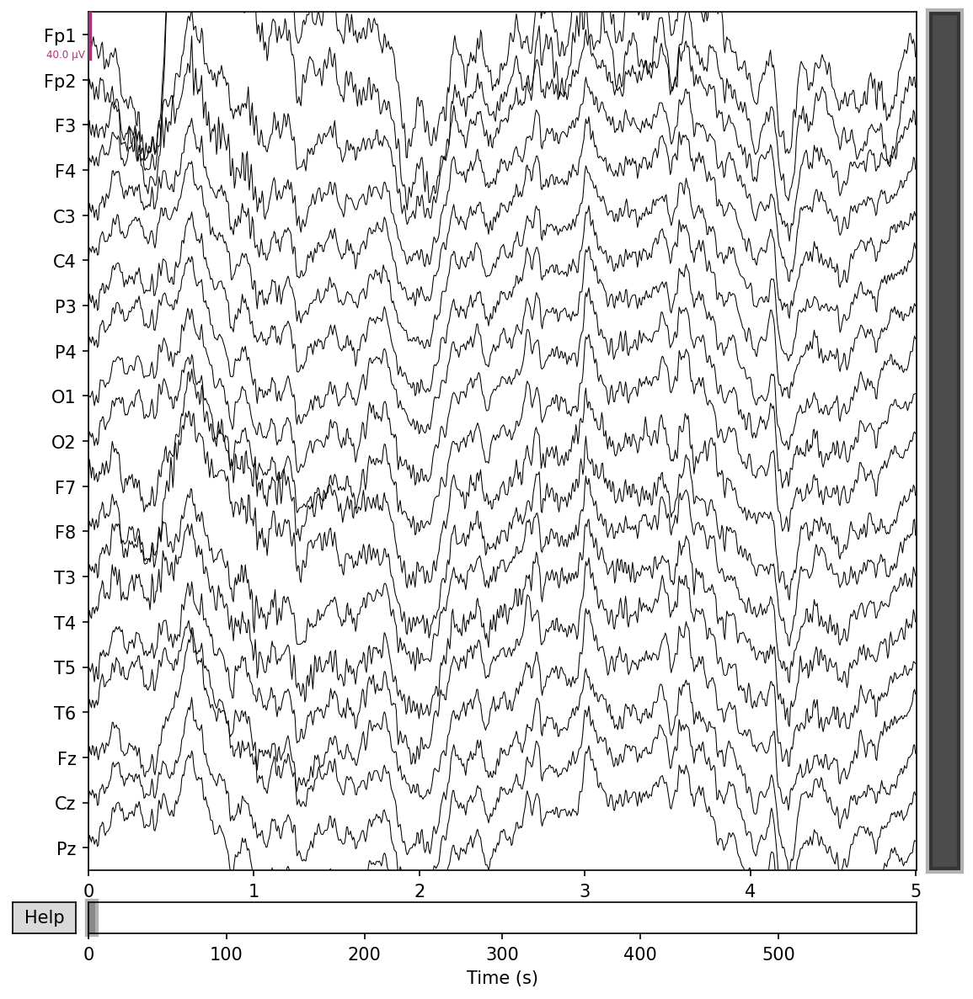

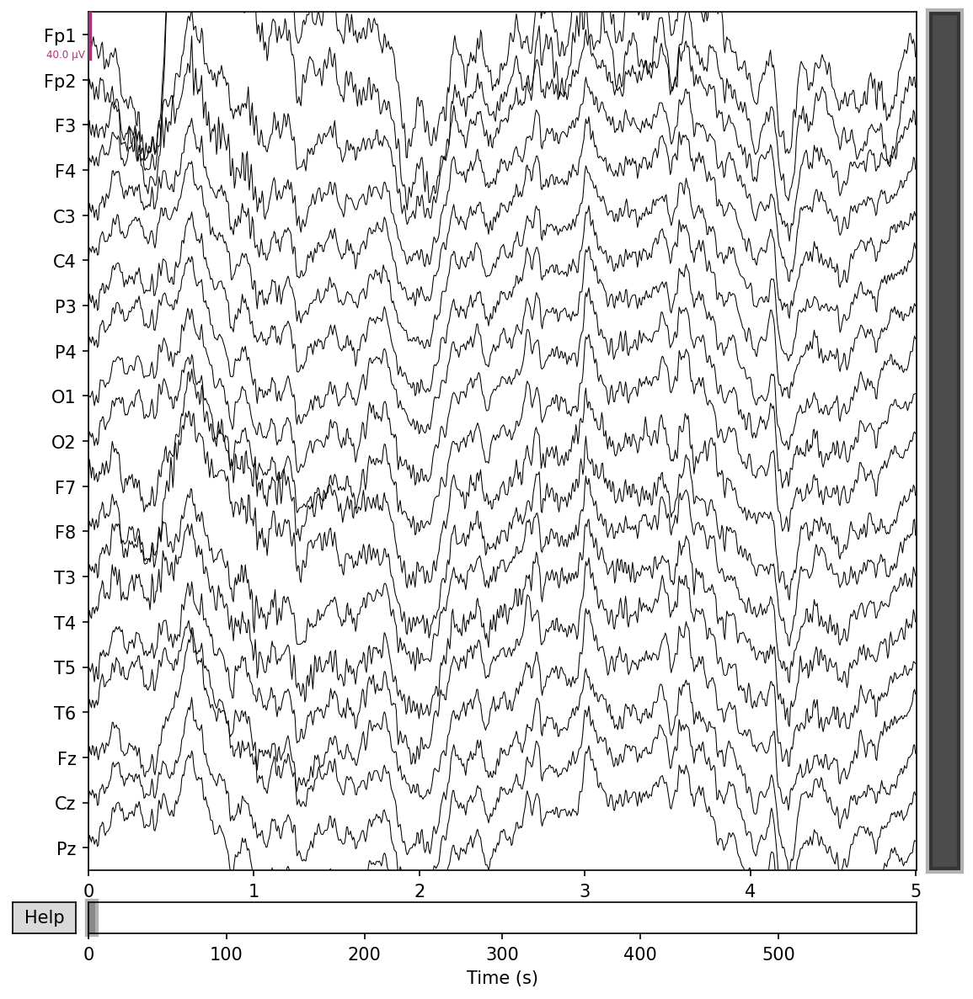

In [ ]:
raw.plot(duration=5, n_channels=32, clipping=None)

#### Plot power spectral density across channels

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


c:\Users\sunge\anaconda3\envs\mne\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


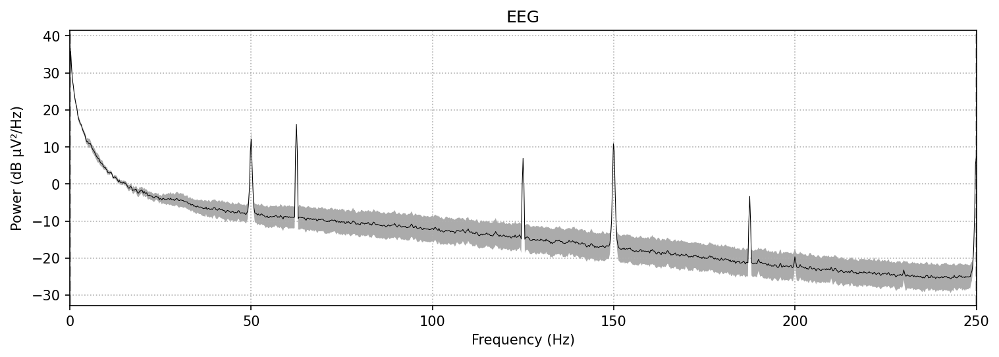

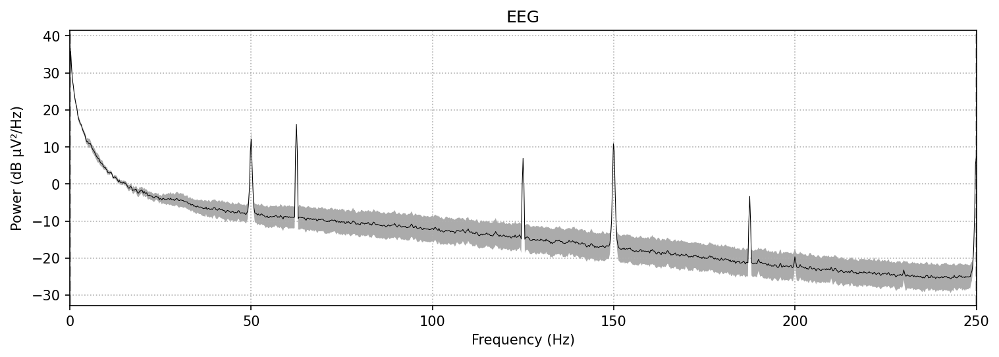

In [6]:
raw.plot_psd(average=True)

#### Plot the channel locations map

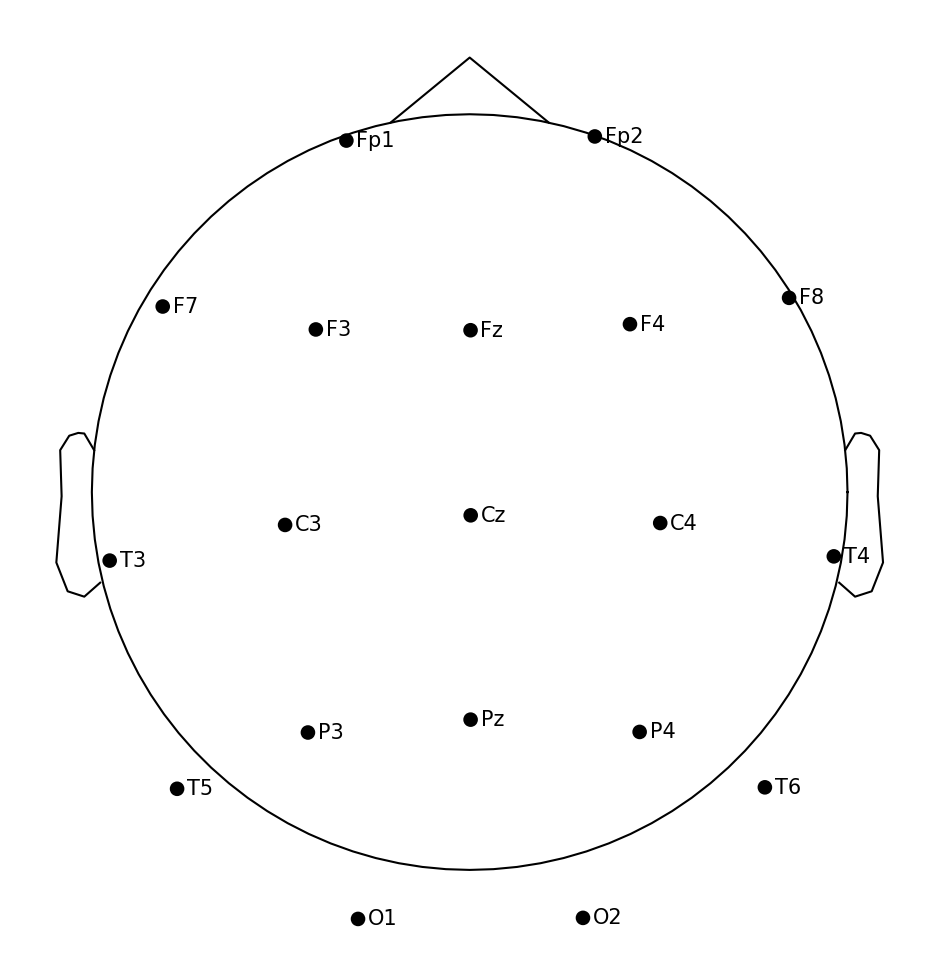

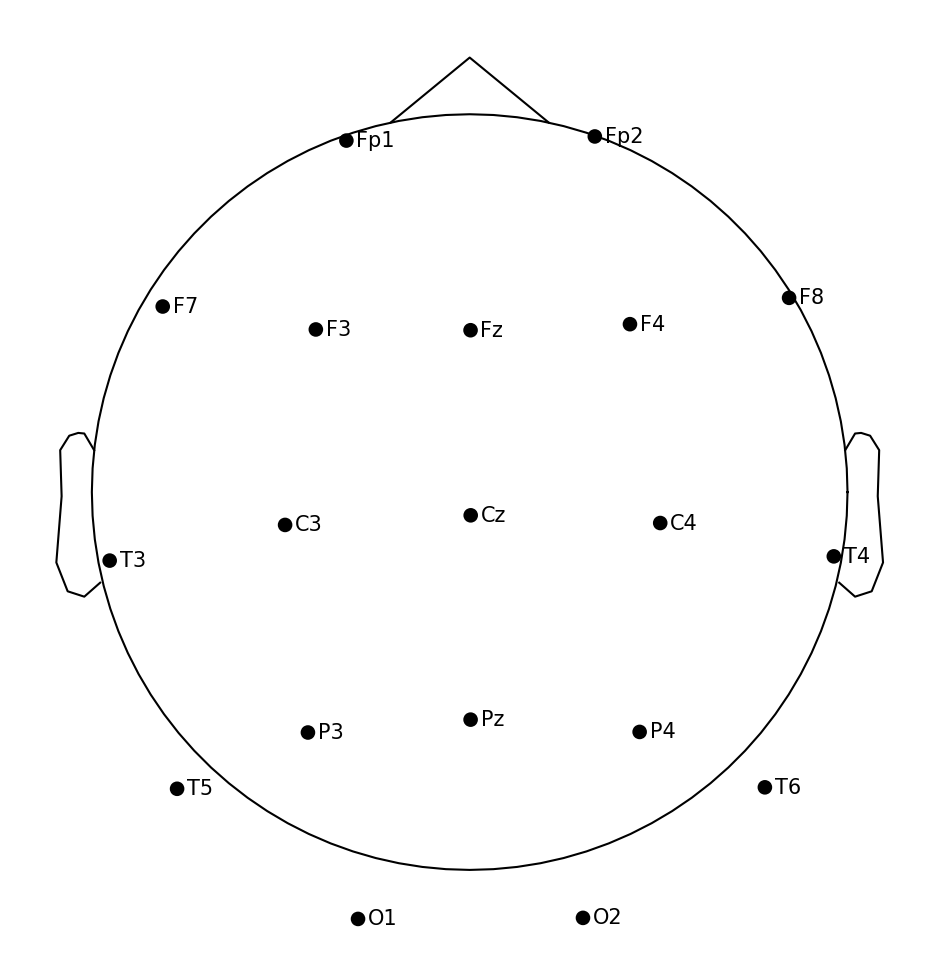

In [7]:
raw.plot_sensors(ch_type='eeg', show_names=True)

#### Plot channel-wise frequency spectra as topography

Effective window size : 4.096 (s)


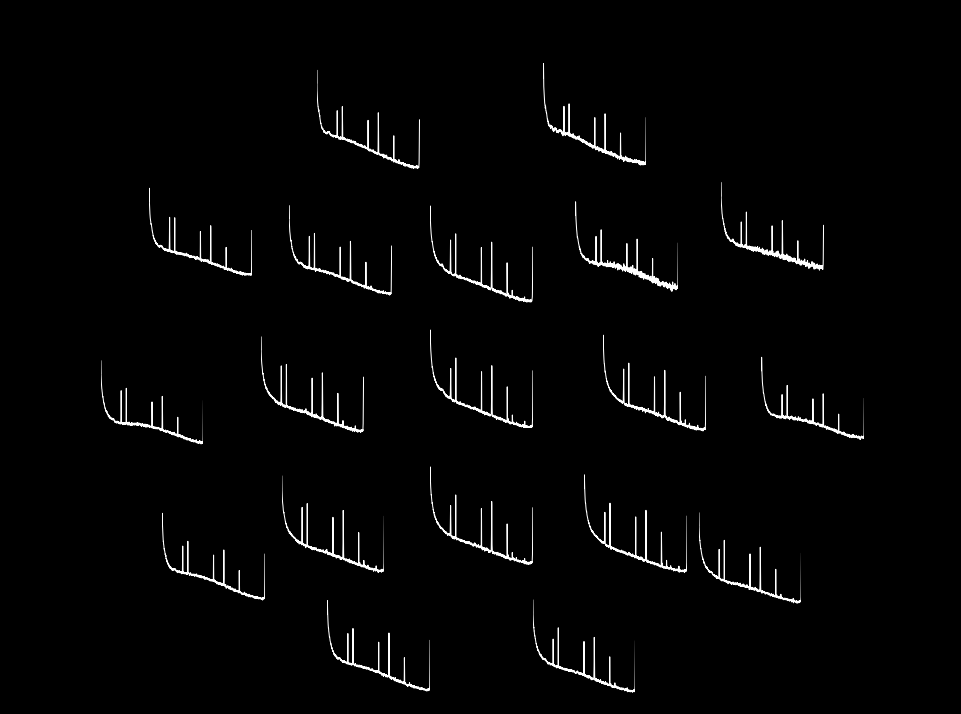

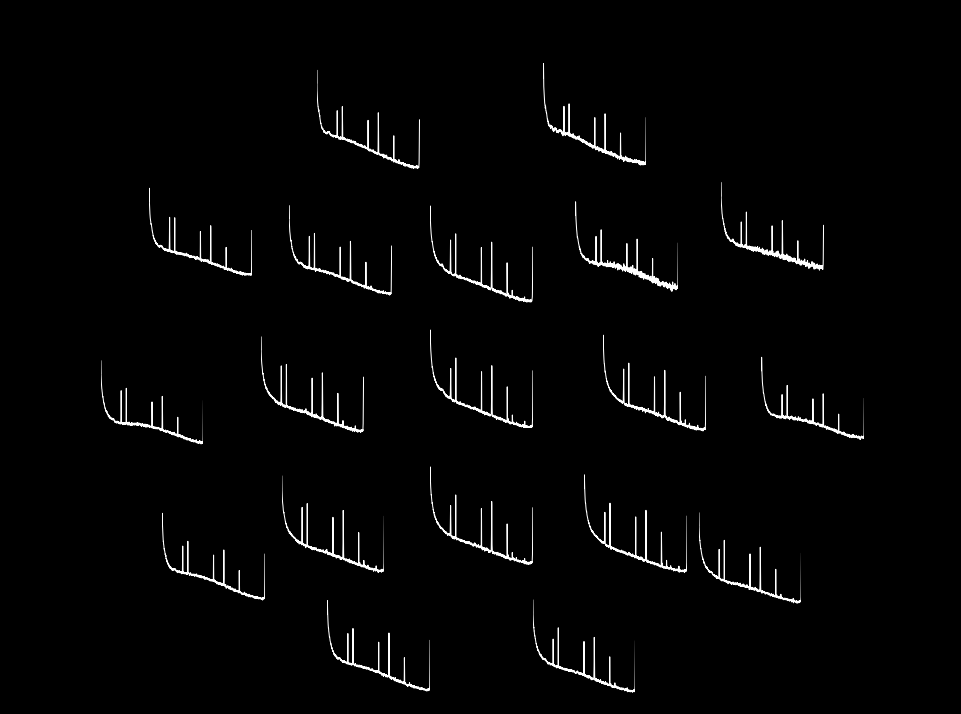

In [8]:
raw.compute_psd().plot_topo()

# Step 2 Filtering Data

### Notch Filtering

Through the power spectrum in Step 1, we can not see notch noise .  
Here first use the trap filter to remove utility frequency.
Different countries and areas may have different utility frequencies. Remember to judge it by the power spectrum.

In [9]:
# raw = raw.notch_filter(freqs=(50))

Plot the power spectrum

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


c:\Users\sunge\anaconda3\envs\mne\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


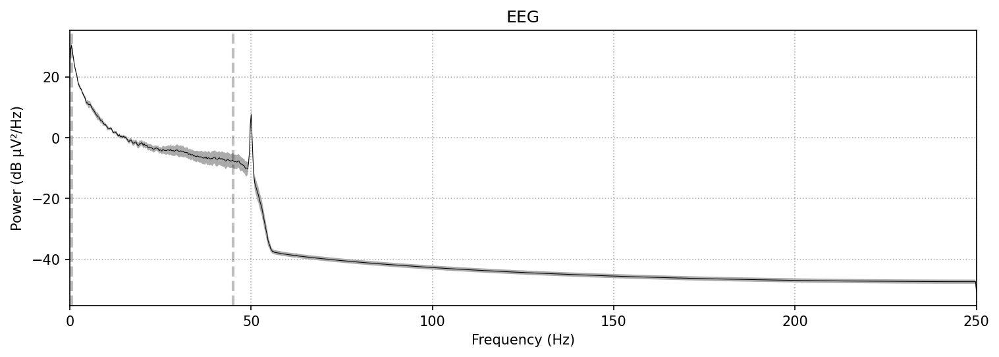

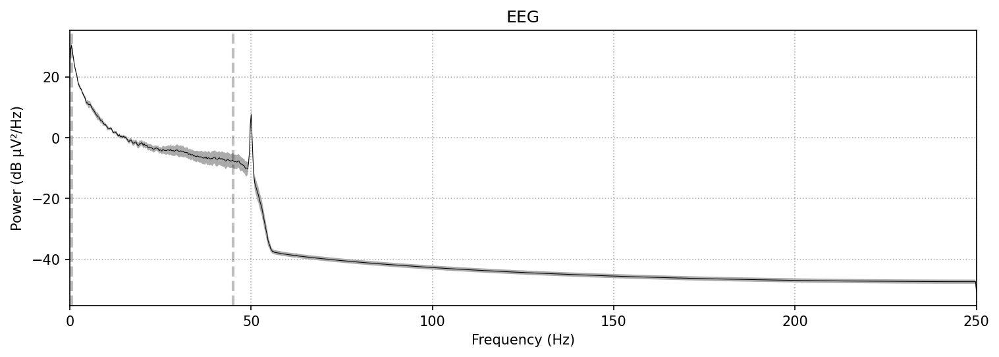

In [15]:
raw.plot_psd(average=True)

### Power line noise

Here we see narrow frequency peaks at 60, 120, 180, and 240 Hz — the power line frequency of usa

### Heartbeat artifacts (ECG)

### High/Low-Pass Filtering

In pre-processing, the high-pass filtering is usually a necessary step.  
The most common filtering operation is to use a low-pass filter at 0.5 Hz and a high-pass filter at 45 Hz according to the readme file of dataset.  
High-pass filtering is used to eliminate voltage drift, and low-pass filtering is used to eliminate high frequency noises.

In [16]:
raw = raw.filter(l_freq=0.5, h_freq=45)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 3301 samples (6.602 s)



In MNE, the default filtering method is FIR. If you want to use IIR filtering method, you can just modify the parameter method:  
method='fir' by default, using IIR is to set method='iir'.  
The corresponding code is below:

> raw = raw.filter(l_freq=0.5, h_freq=45, method='iir')

Plot the power spectrum

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


c:\Users\sunge\anaconda3\envs\mne\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


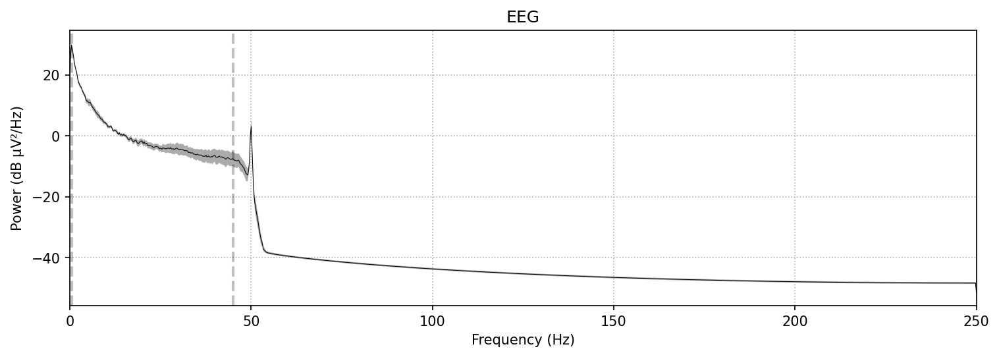

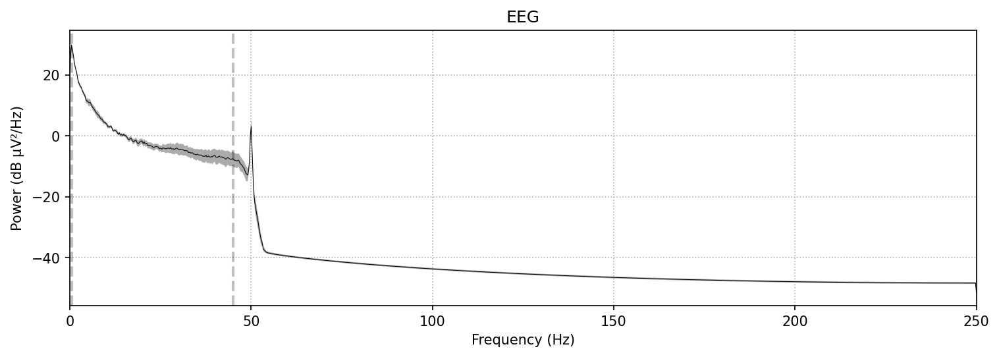

In [17]:
raw.plot_psd(average=True)

# Step 3 Rejecting Artifacts

Here we suggest the users to check this website "Overview of artifact detection" from MNE-Python website:  
https://mne.tools/stable/auto_tutorials/preprocessing/10_preprocessing_overview.html  
where they provide detailed introduction about checking EEG data quality and detecting different types of artifacts.

### Remove Bad Segments

Bad segment marking can be done manually via MNE-Python GUI, but this part i recomment you the EEGLAB by hand.

#### Run ICA

The programming idea of ICA in MNE is to first build an ICA object (which can be understood as building an ICA analyzer) then use this ICA analyzer to analyze the EEG data (through methods of ICA object).  
Since ICA is not effective for low frequency data, here ICA and artifact components removal are based on high-pass 1Hz data and then applied to high-pass 0.1Hz data.

In [18]:
from mne.preprocessing import ICA
ica = ICA(max_iter='auto')
raw_for_ica = raw.copy().filter(l_freq=1, h_freq=None)
ica.fit(raw_for_ica)

Filtering raw data in 1 contiguous segment


Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1651 samples (3.302 s)

Fitting ICA to data using 19 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  19 out of  19 | elapsed:    0.0s finished


Selecting by non-zero PCA components: 19 components
Fitting ICA took 3.7s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,27 iterations on raw data (299900 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


We set n_components here, i.e. the number of ICA components which is automatically selected by MNE's ICA analyzer.  
Similar to EEGLAB, if you want the number of ICA components to be fixed, you can customize the setting (n_components<=n_channels).  
Taking 30 independent components as an example, the corresponding code can be changed as follows：

> ica = ICA(n_components=30, max_iter='auto')

#### Plot the timing signal of each component

Creating RawArray with float64 data, n_channels=19, n_times=299900
    Range : 0 ... 299899 =      0.000 ...   599.798 secs
Ready.


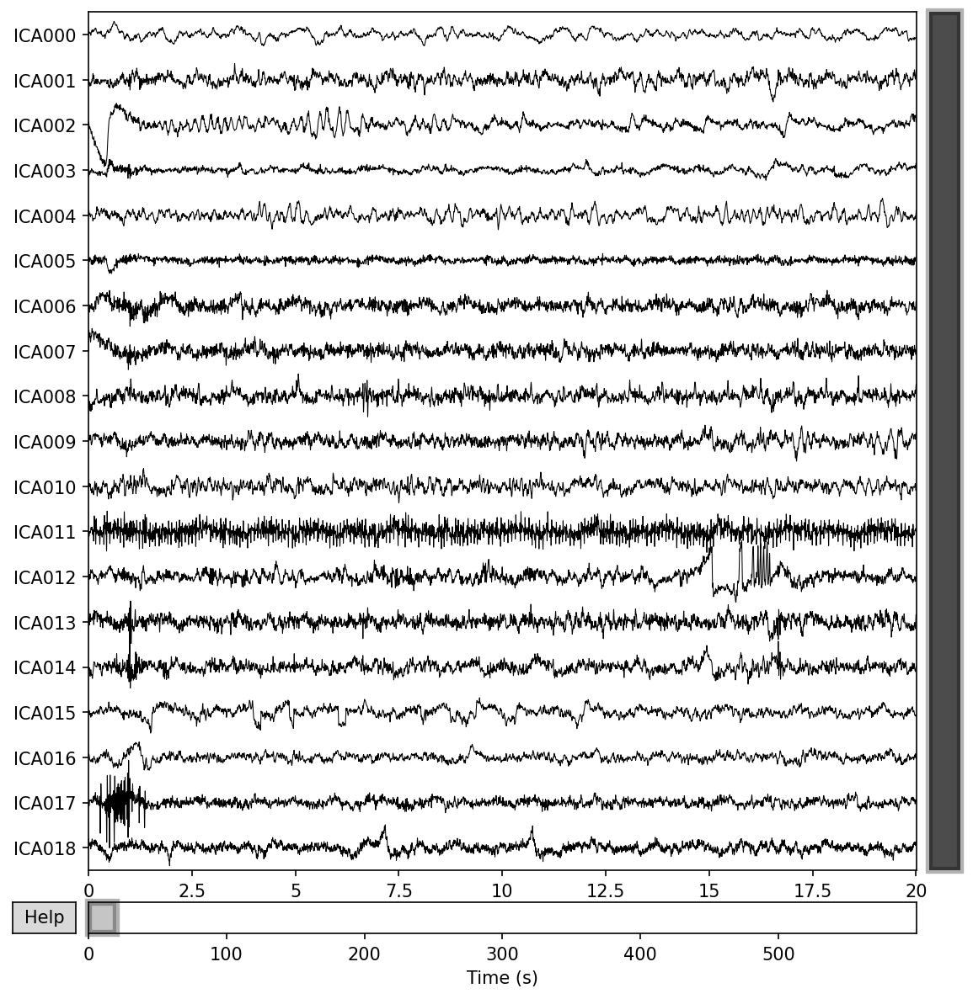

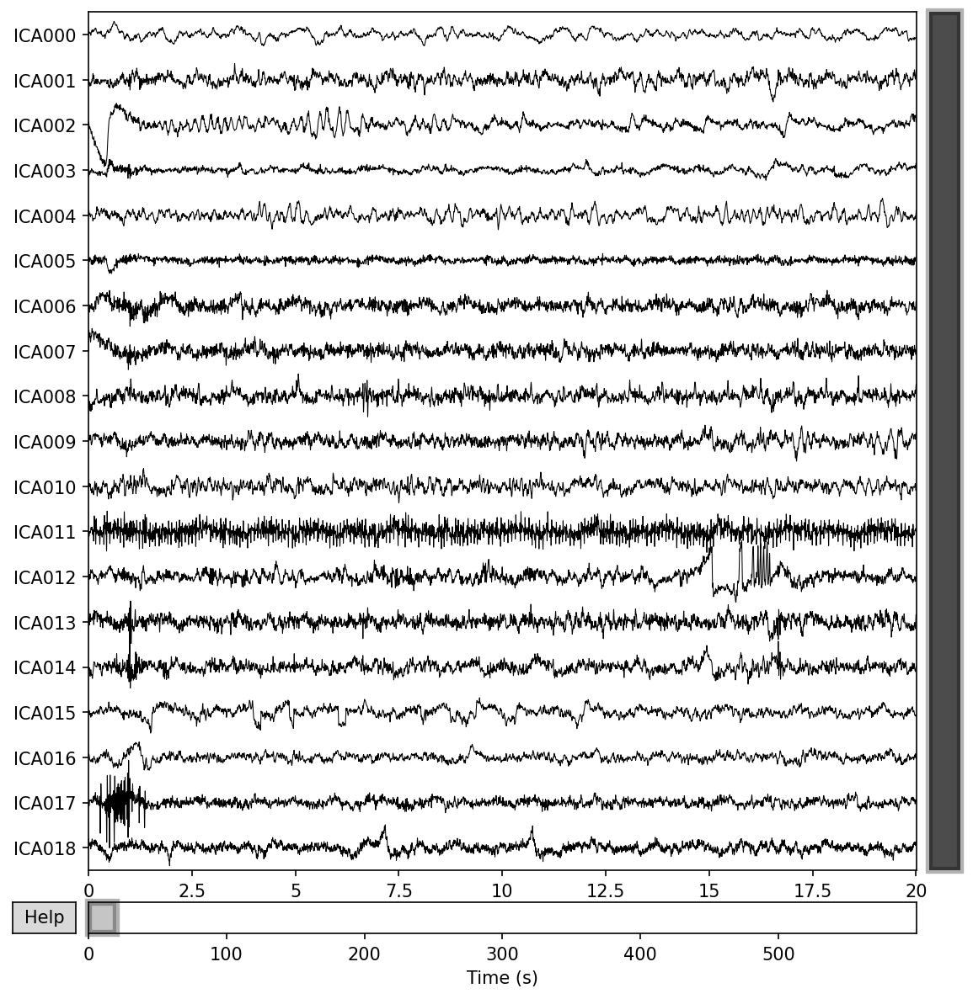

In [19]:
ica.plot_sources(raw_for_ica)

#### Plot the topography of each component

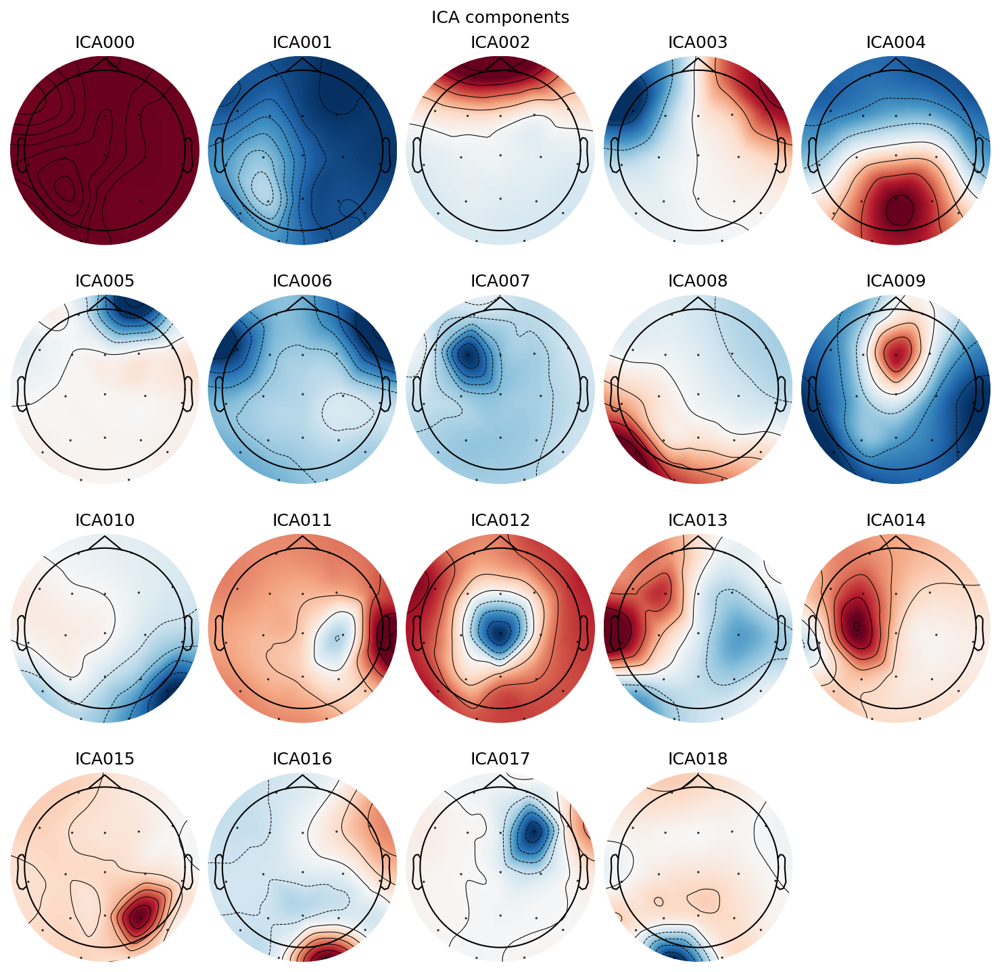

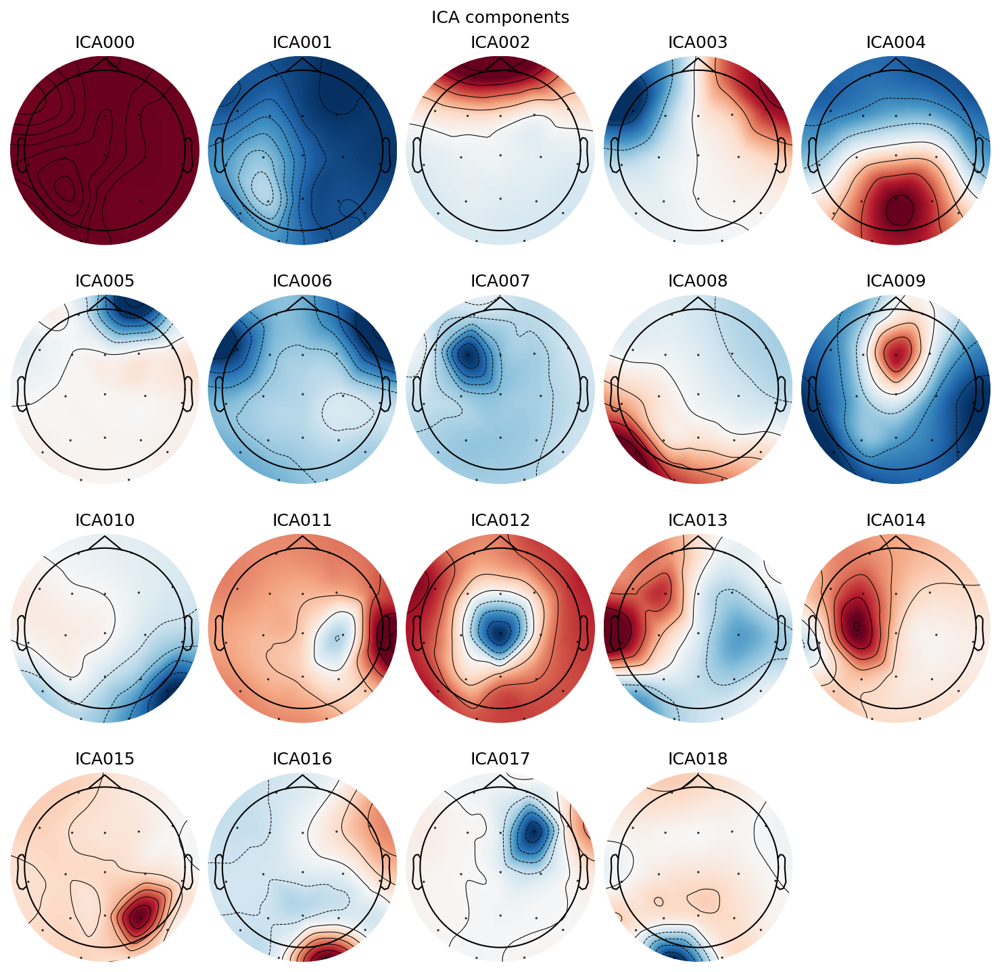

In [20]:
ica.plot_components()

#### Check the signal difference before and after the removal of a component / several component.

Here is an example of removing the 2rd component (i.e. ICA001)

Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 1 ICA component
    Projecting back using 19 PCA components


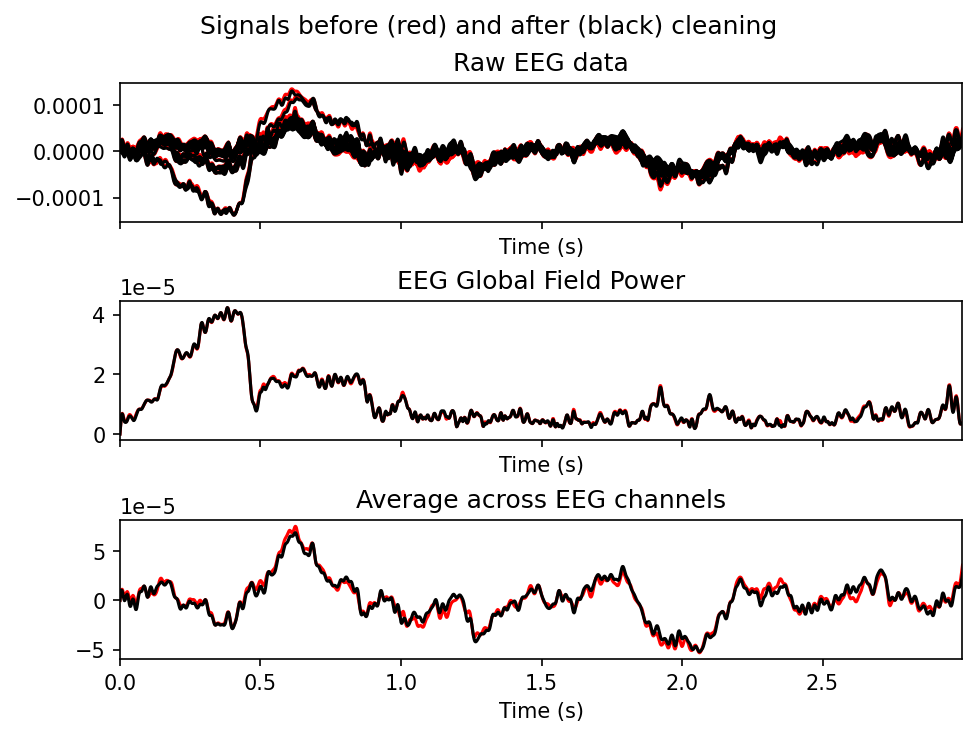

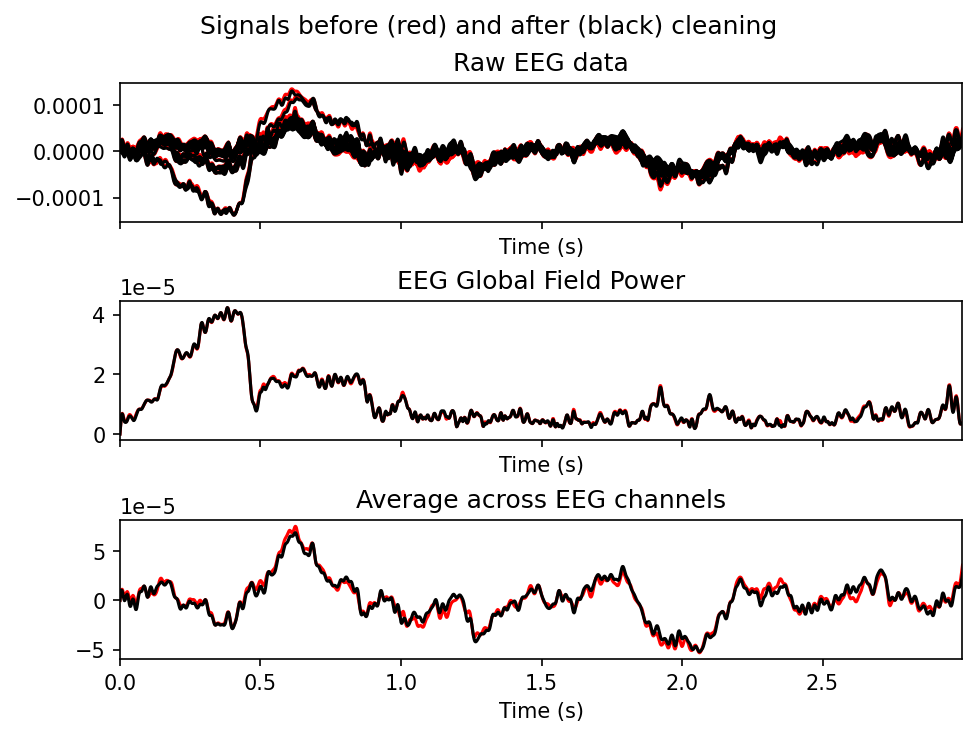

In [21]:
ica.plot_overlay(raw_for_ica, exclude=[1])

#### Visualize each component

In the example, we visualize the 2nd component (ICA001).

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
299 matching events found
No baseline correction applied
0 projection items activated


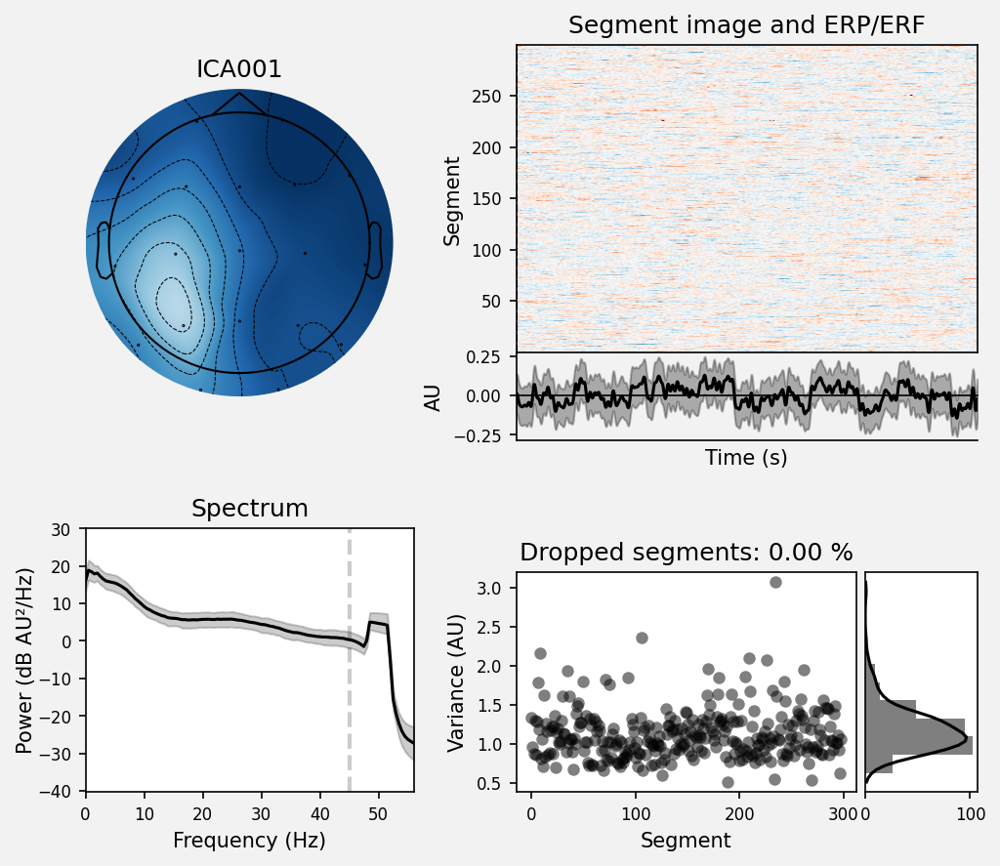

[<Figure size 1050x900 with 6 Axes>]

In [22]:
ica.plot_properties(raw, picks=[1])

The power of component ICA001 is higher in the frontal area and is higher at low frequencies, with significant enhancement in some trials.  
It can be judged as an EOG component.

#### Exclude components

In [23]:
# set the component index(es) to exclude
ica.exclude = [1]
# apply to EEG data
ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 1 ICA component
    Projecting back using 19 PCA components


<RawEEGLAB | sub-001_task-eyesclosed_eeg.set, 19 x 299900 (599.8 s), ~43.5 MiB, data loaded>

Plot the waveform of the data after ICA

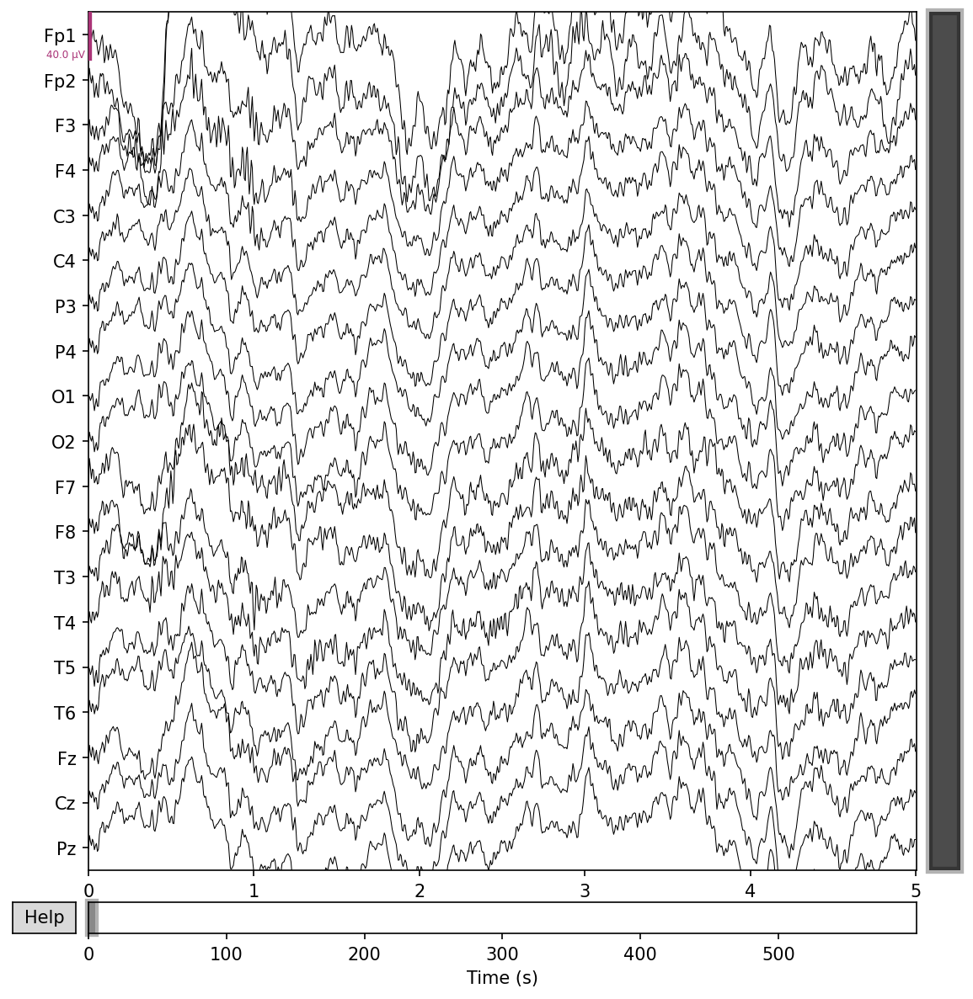

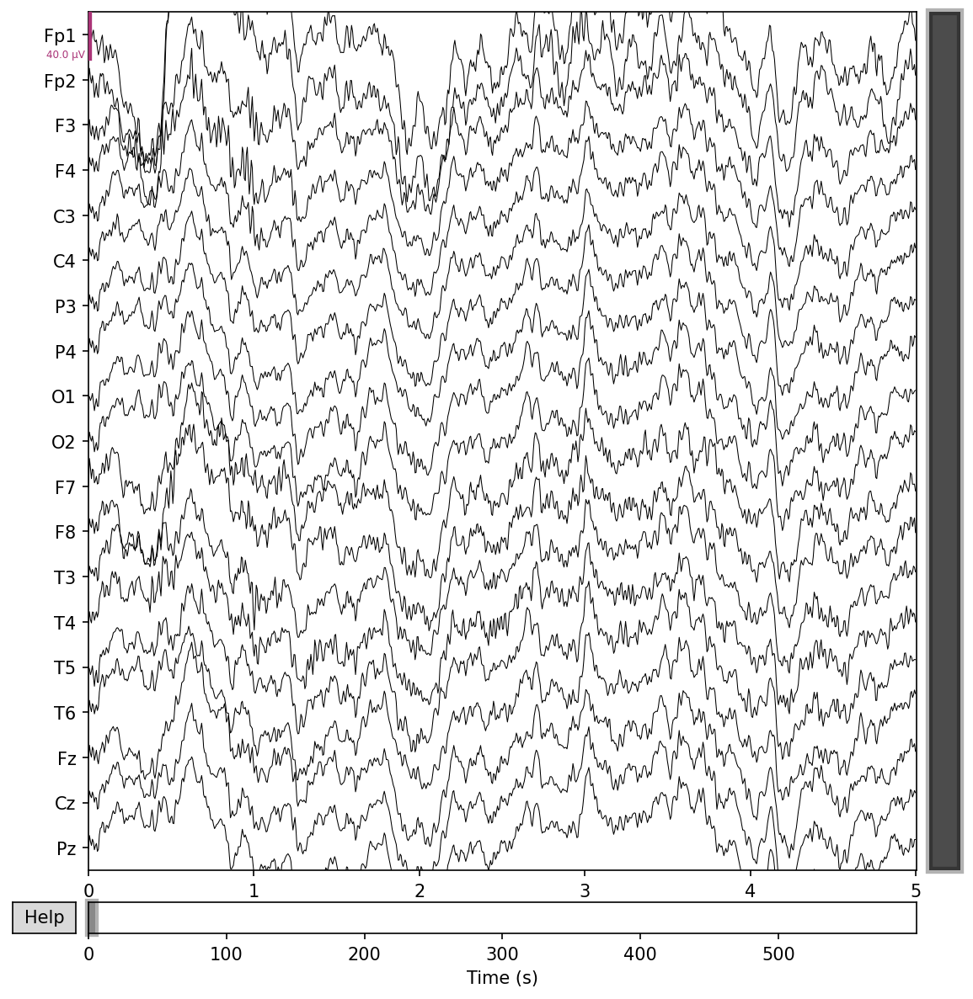

In [24]:
raw.plot(duration=5, n_channels=32, clipping=None)

# Step 4 Setting the Reference
set amplitude to average level

If you want to use the papillary reference method, usually we use 'F3' and 'F4' as reference channels. You could use the following codes:

In [25]:
raw.set_eeg_reference(ref_channels=['F3','F4'])  

EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-001_task-eyesclosed_eeg.set, 19 x 299900 (599.8 s), ~43.5 MiB, data loaded>

If you want to use the average reference method, you could use the following code:

In [26]:
raw.set_eeg_reference(ref_channels='average')  

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEEGLAB | sub-001_task-eyesclosed_eeg.set, 19 x 299900 (599.8 s), ~43.5 MiB, data loaded>

# Step 5 Segmenting Data into Epochs

### define Events Information and Segmentating Data

In [55]:
#  segment :s
segment_length = 2.0  

# fixed-length segment
events = mne.make_fixed_length_events(raw, id=1, duration=segment_length)

tmin = 0.0  
tmax = segment_length  

# 创建 Epochs
epochs = mne.Epochs(raw, events, event_id=1, tmin=tmin, tmax=tmax, baseline=None,preload=True)

Not setting metadata
299 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 299 events and 1001 original time points ...
0 bad epochs dropped


In [28]:
print(epochs)

<Epochs | 299 events (all good), 0 – 2 s (baseline off), ~43.4 MiB, data loaded,
 '1': 299>


### Visualizing Segmented Data

Visualize the segmented data (here, we show 4 epochs).

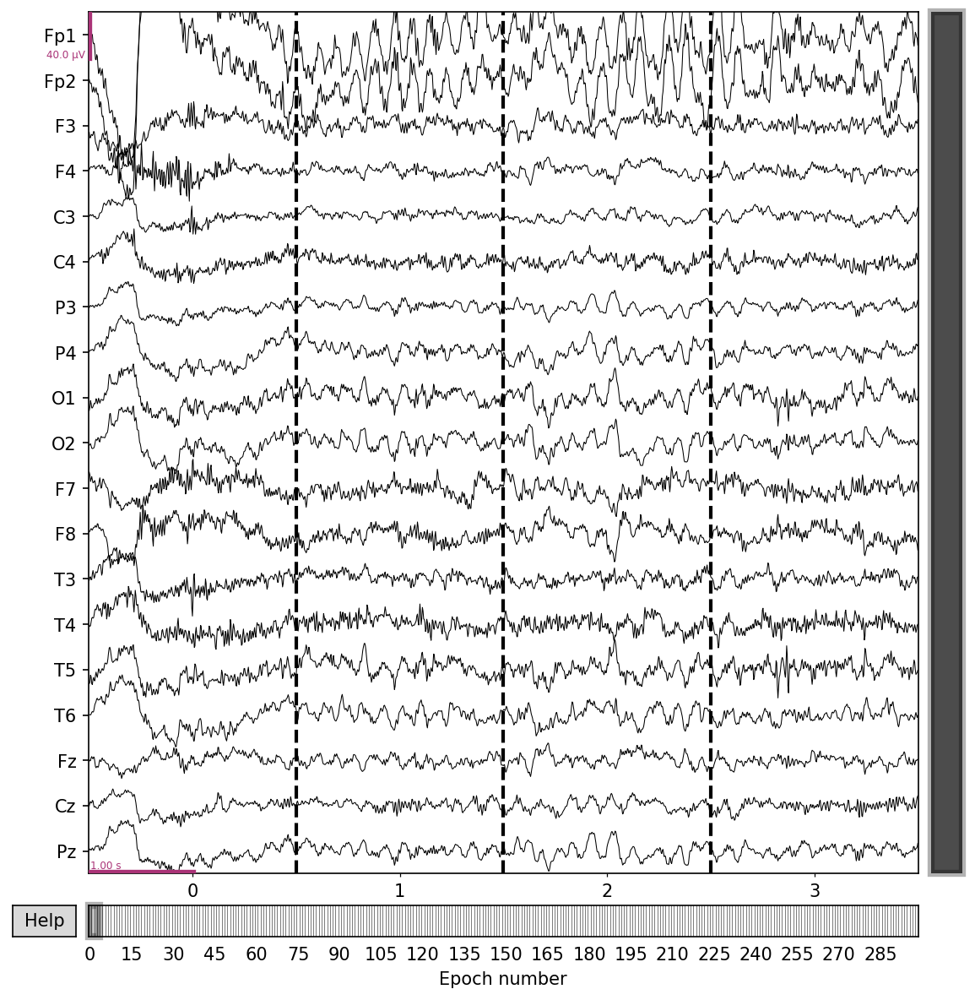

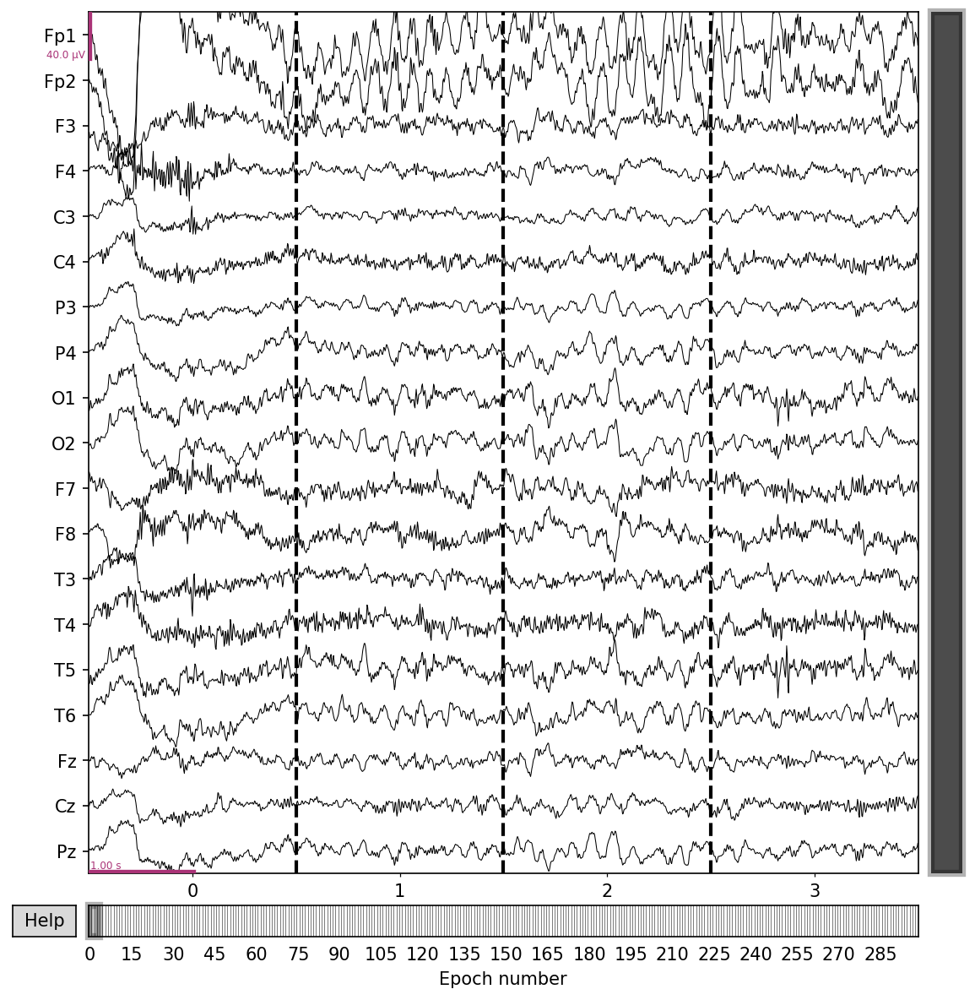

In [29]:
epochs.plot(n_epochs=4)

In [ ]:
# pip install mne==1.6 matplotlib==3.7


    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


c:\Users\sunge\anaconda3\envs\mne\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


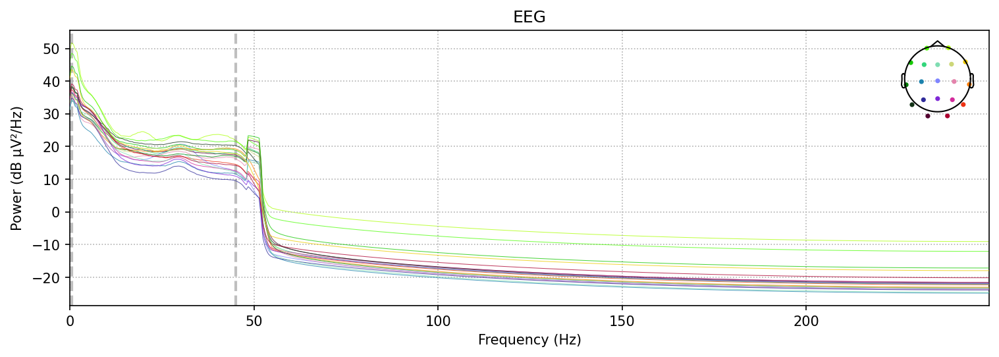

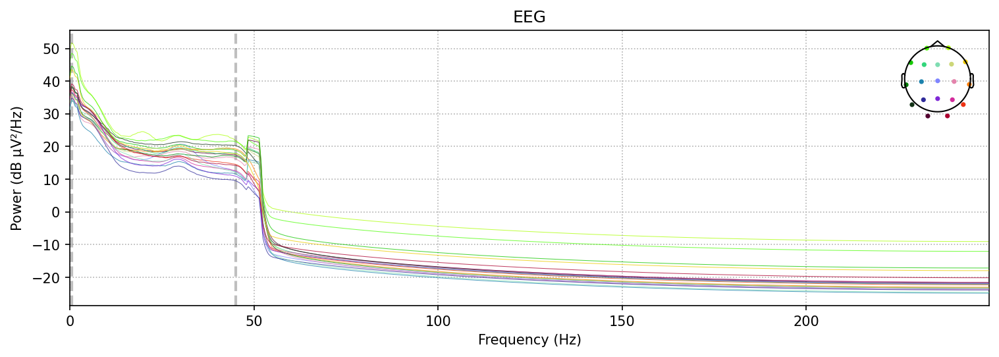

In [31]:
epochs.compute_psd().plot(picks='eeg')

#### Plot the power spectrum topology (of Theta, Alpha and Beta bands):

NOTE: plot_psd_topomap() is a legacy function. New code should use .compute_psd().plot_topomap().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs before plotting...
converting legacy list-of-tuples input to a dict for the `bands` parameter


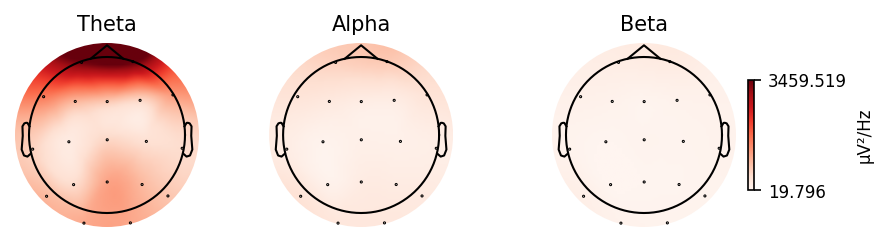

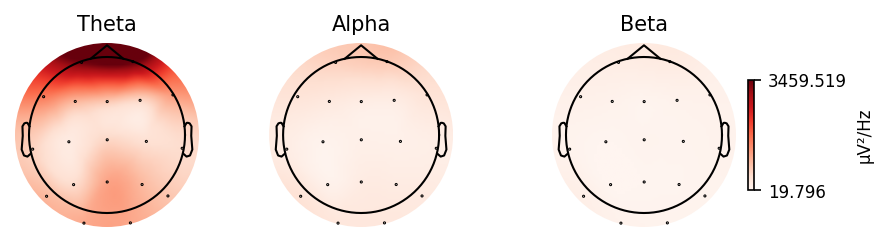

In [32]:
bands = [(4, 8, 'Theta'), (8, 12, 'Alpha'), (12, 30, 'Beta')]
epochs.plot_psd_topomap(bands=bands, vlim='joint')

# Step 6 Data Averaging

MNE uses the Epochs Class to store segmented data and the Evoked Class to store evoked (after averaging) data

### Average Data

In [33]:
evoked = epochs.average()

In [41]:
print(evoked)

<Evoked | '1' (average, N=299), 0 – 2 s, baseline off, 19 ch, ~180 KiB>


### Visualize Evoked Data

#### Plot channel-wise timing signals

No projector specified for this dataset. Please consider the method self.add_proj.


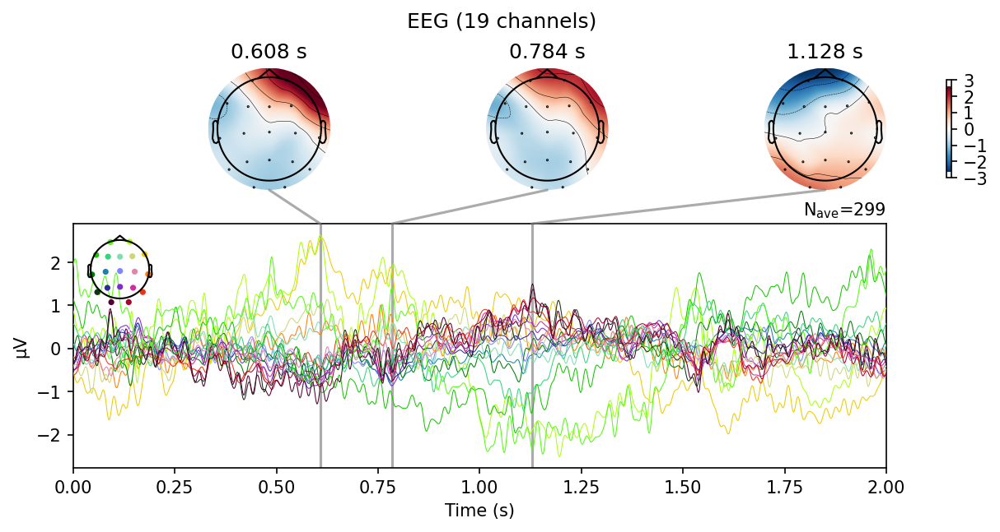

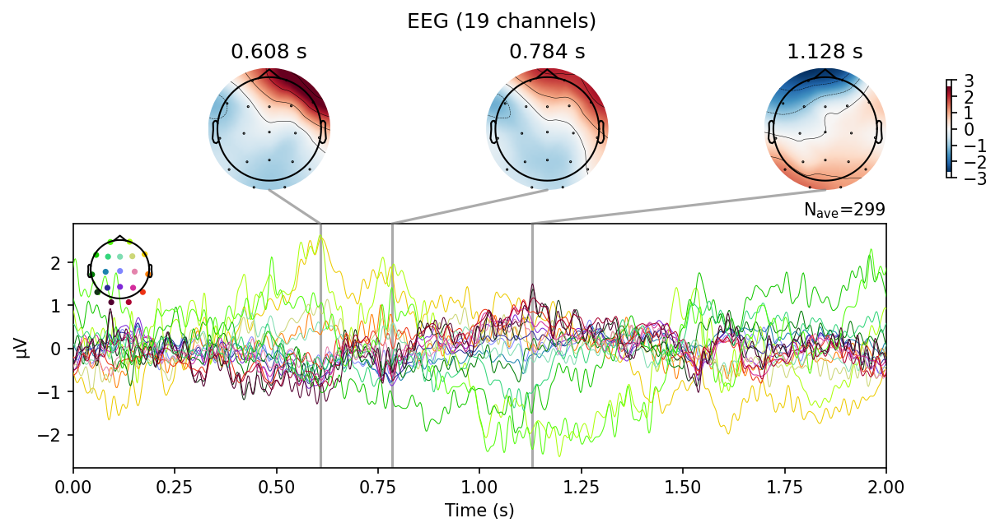

In [34]:
evoked.plot_joint()

#### Plot topographic maps

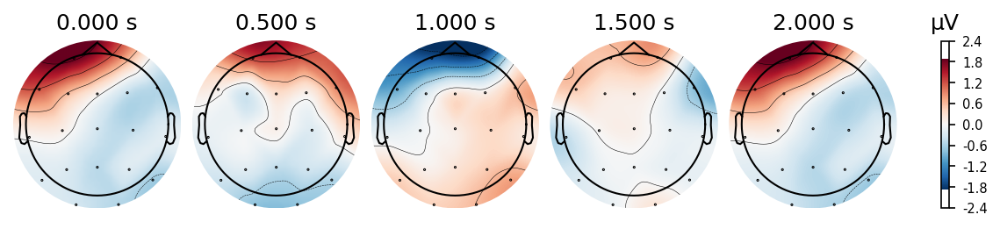

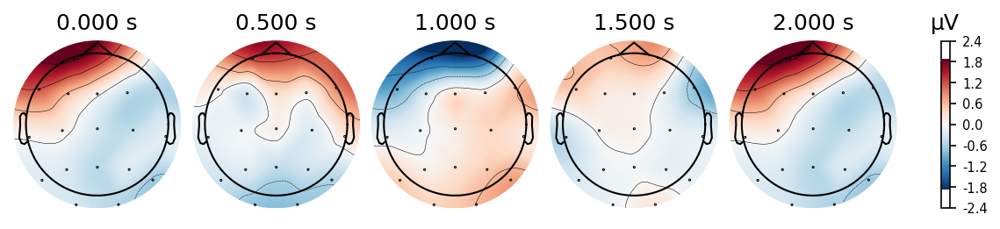

In [35]:
# Plot the topographic map at 0ms、0.5s、1s、1.5s and 2s
times = np.linspace(0, 2, 5)
evoked.plot_topomap(times=times, colorbar=True)

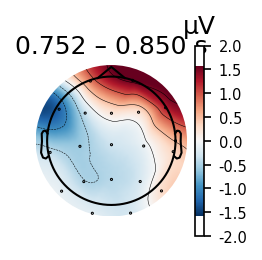

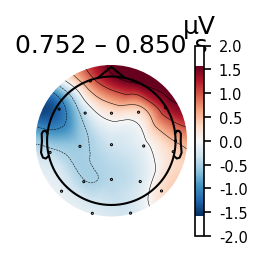

In [36]:
# Plot the topographic map at a particular time-point
# In this example, we plot the figure at 0.8s
# where we take the mean value from 0.75 to 0.85s

evoked.plot_topomap(times=0.8, average=0.1)

#### Plot evoked data as butterfly plot and add topomaps

#### Plotting channel-wise hotmaps

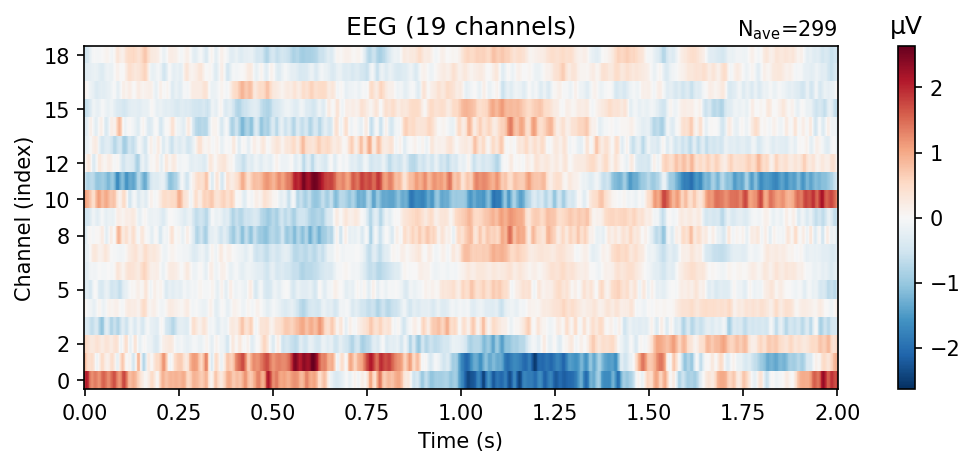

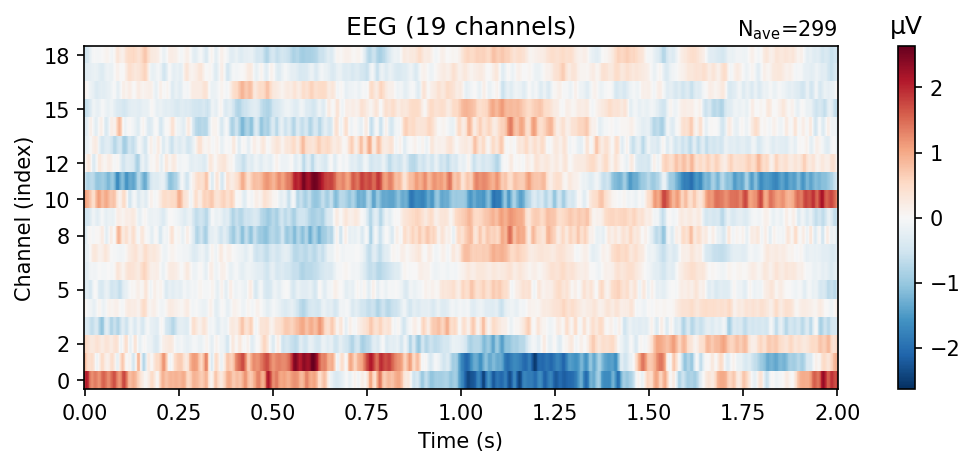

In [37]:
evoked.plot_image()

#### Plot 2D topography

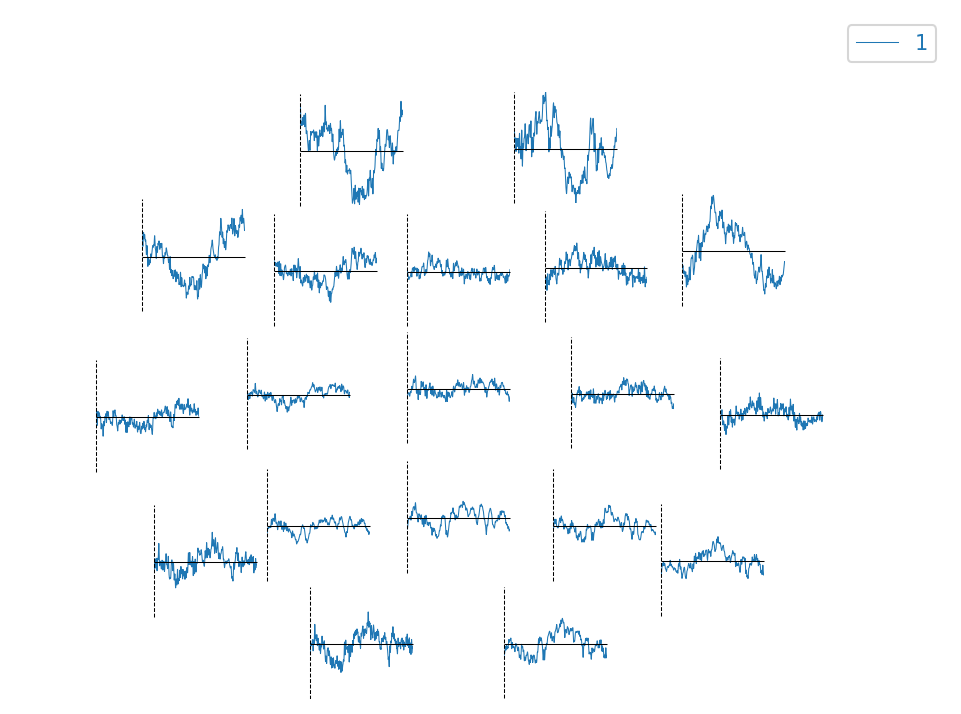

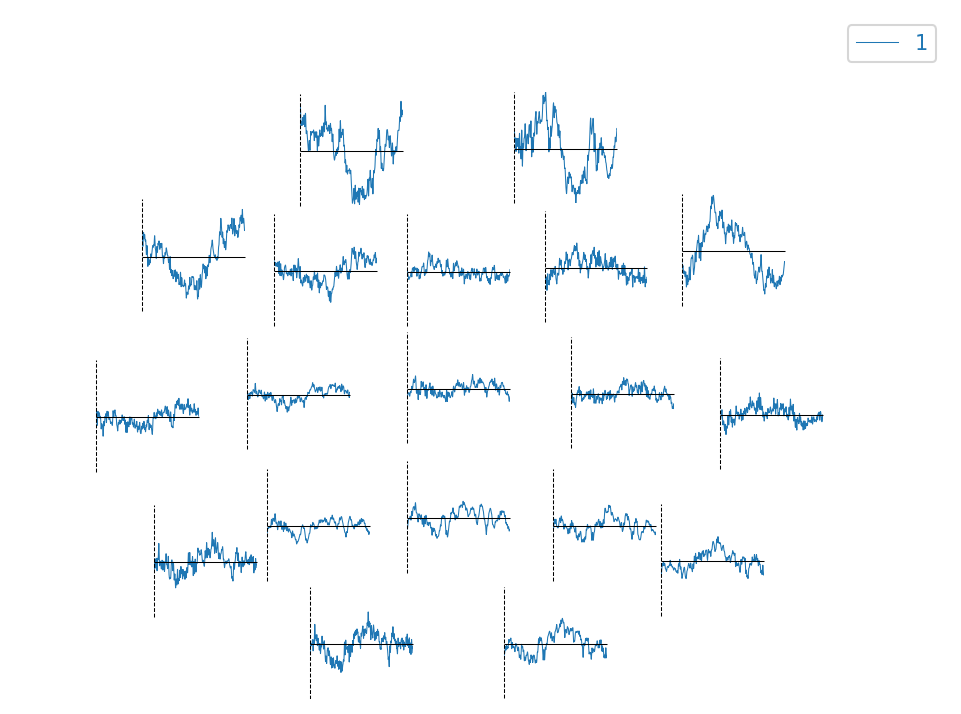

In [38]:
evoked.plot_topo()

#### Plot the averaged ERP of all channels

combining channels using "mean"


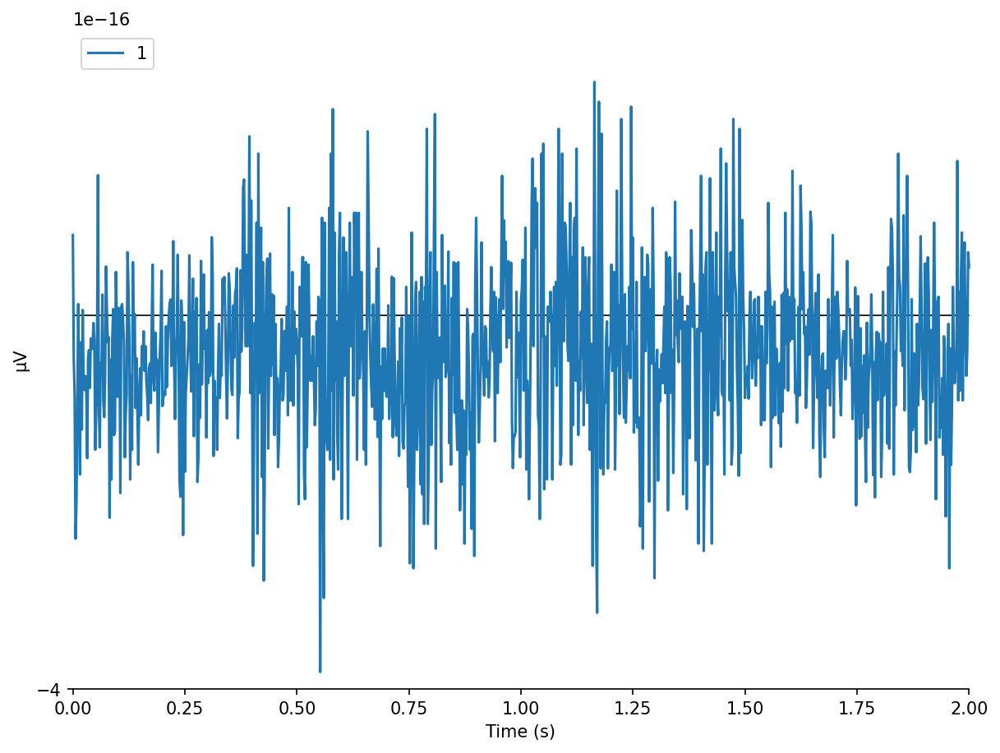

[<Figure size 1200x900 with 1 Axes>]

In [39]:
mne.viz.plot_compare_evokeds(evokeds=evoked, combine='mean')

Plotting the averaged ERP of occipital channels

combining channels using "mean"


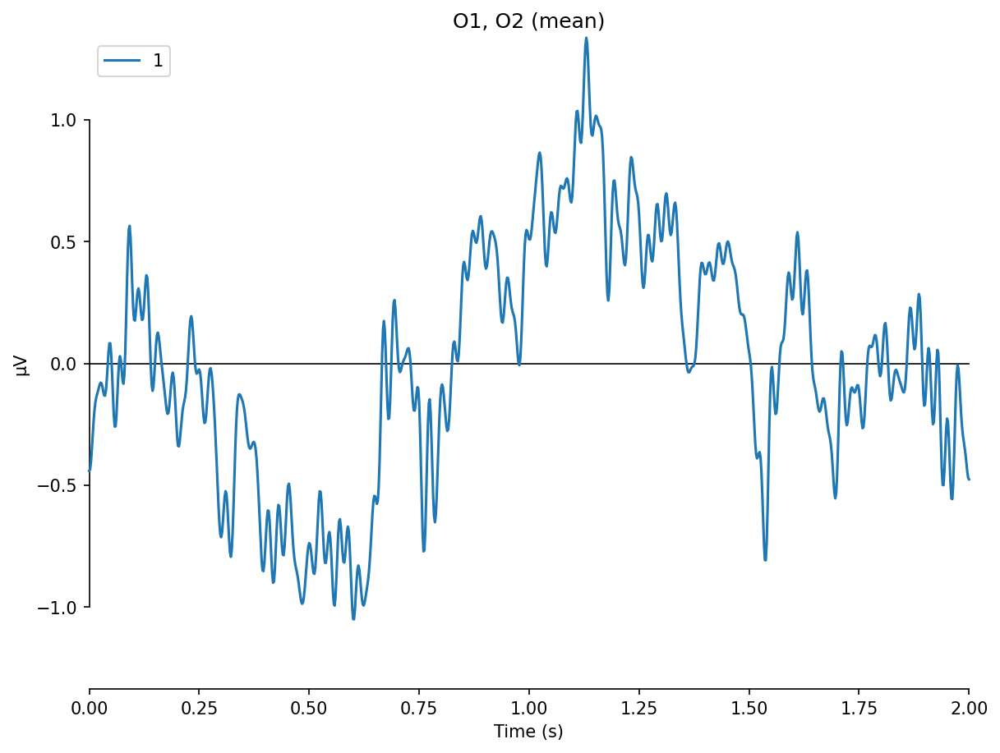

[<Figure size 1200x900 with 1 Axes>]

In [42]:
mne.viz.plot_compare_evokeds(evokeds=evoked, picks=['O1', 'O2'], combine='mean')

# Step 7 Time-Frequency Analysis

MNE provides three methods for time-frequency analysis, which are
- Morlet wavelets, corresponding to mne.time_frequency.tfr_morlet()  
- DPSS tapers, corresponding to mne.time_frequency.tfr_multitaper()  
- Stockwell Transform, corresponding to mne.time_frequency.tfr_stockwell()

Here, the first method is used as an example:

### Conduct Time-Frequency Analysis

#### Calculate power and inter-trial coherence (ITC)

In [43]:
# Set some parameters for time-frequency analysis
# The frequency band is selected from 4 to 30 Hz

freqs = np.logspace(*np.log10([4, 30]), num=10)
n_cycles = freqs / 2.
power, itc = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, use_fft=True)

NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  19 out of  19 | elapsed:    2.2s finished


The returned power is the Power result, and itc is the inter-trial coupling result.  
MNE returns the average result of all trials by default.  
If you want to get the separate time-frequency analysis results of each trial, you can just set the average parameter to False.  
The corresponding code can be modified as follows:
> power, itc = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, use_fft=True, average=False)

### Plot the Time-Frequency Result

The visualization methods of time-frequency in MNE allows us to select different baseline correlation methods.
The corresponding parameter is mode, which includes the following options:  
- 'mean', to subtract the baseline mean  
- 'ratio', to divide by the baseline mean  
- 'logratio', to divide by the baseline mean and take log  
- 'percent', to subtract the baseline mean and divide by the baseline mean  
- 'zscore', to subtract the baseline mean and divide by the baseline standard deviation  
- 'zlogratio', to divide by the baseline mean and take the log and then divide by the standard deviation of the baseline after taking the log  

In the following example, the logratio method is chosen for baseline correction.

#### Plot power result of occipital channels

Applying baseline correction (mode: logratio)


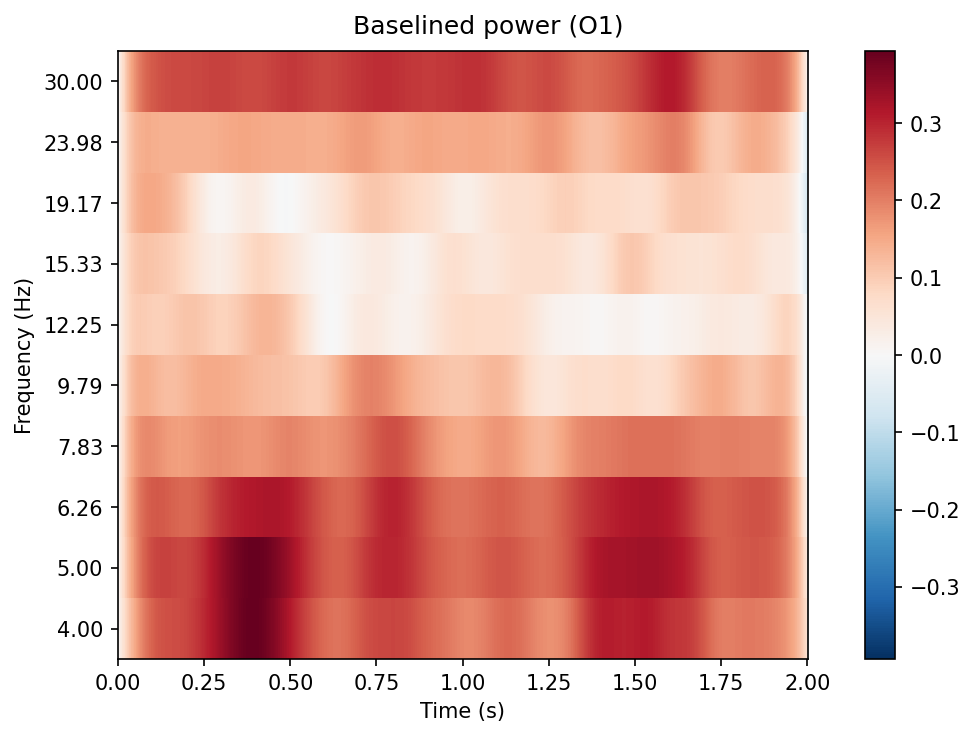

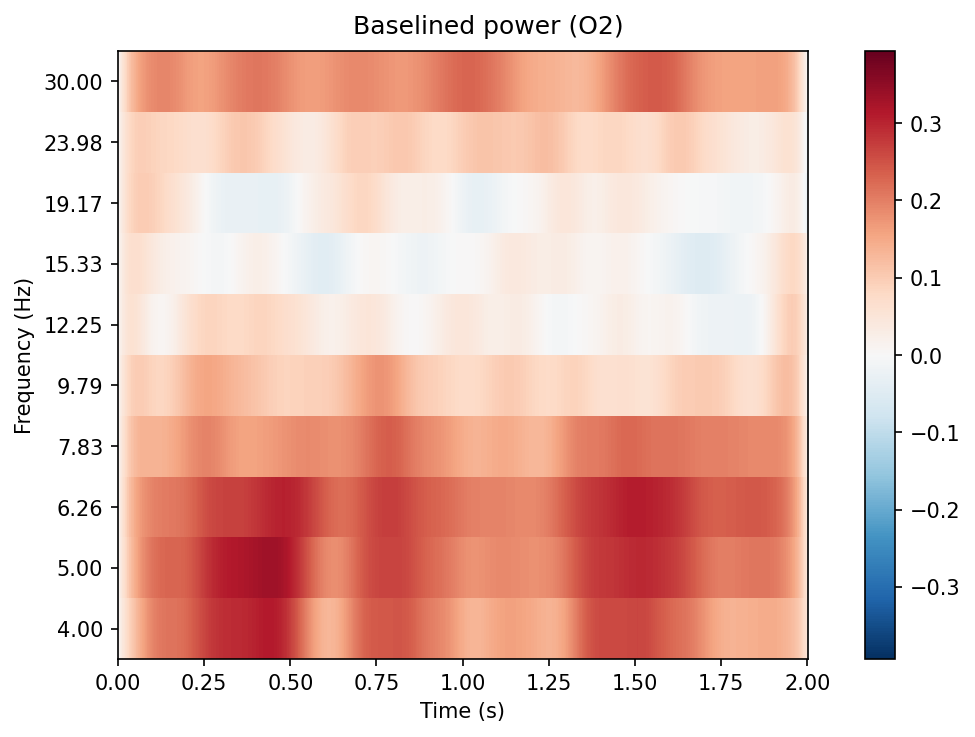

[<Figure size 960x720 with 2 Axes>, <Figure size 960x720 with 2 Axes>]

In [45]:
power.plot(picks=['O1', 'O2'], baseline=(-0.5, 0), mode='logratio', title='auto')

#### Plot mean power result of occipital channels

Applying baseline correction (mode: logratio)


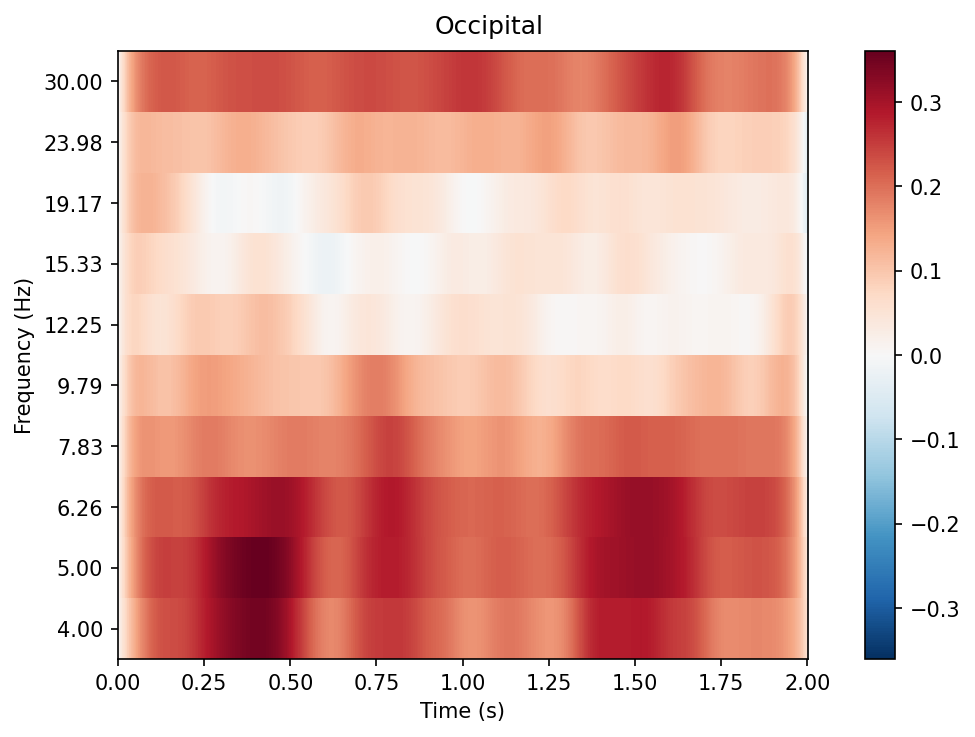

[<Figure size 960x720 with 2 Axes>]

In [47]:
power.plot(picks=['O1', 'O2'], baseline=(-0.5, 0), mode='logratio',
           title='Occipital', combine='mean')

#### Plot 2D power topology

Applying baseline correction (mode: logratio)


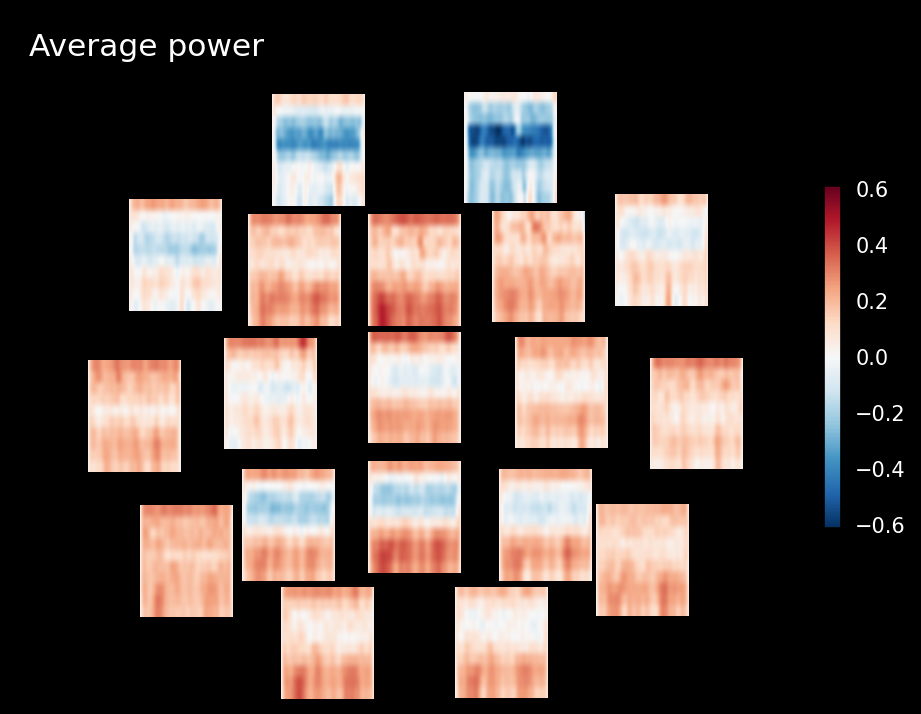

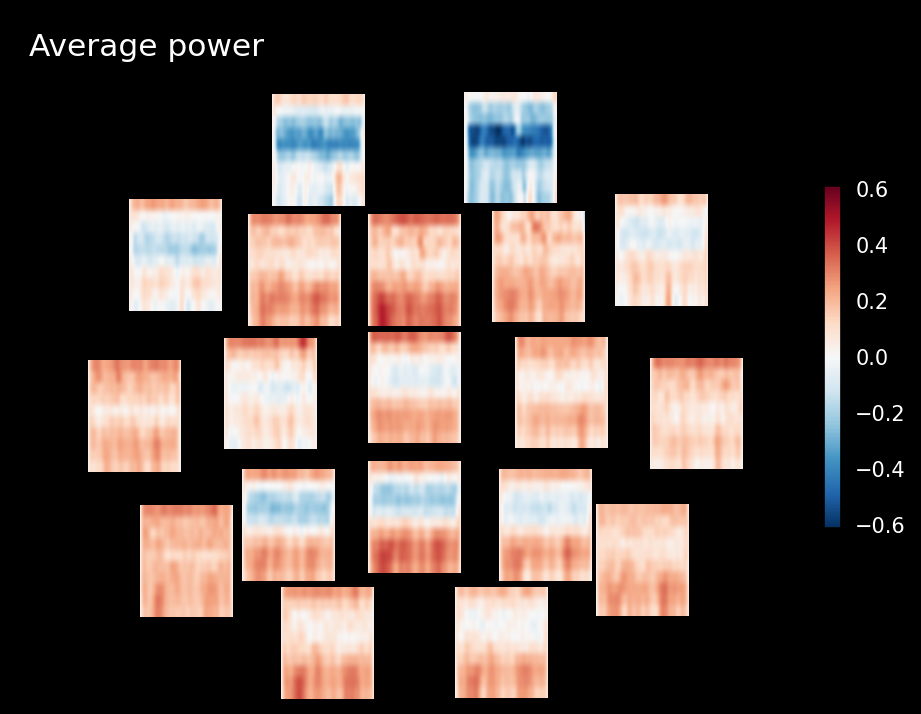

In [48]:
power.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average power')

#### Plot power topology for different frequencies

Applying baseline correction (mode: logratio)


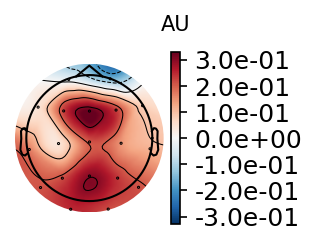

Applying baseline correction (mode: logratio)


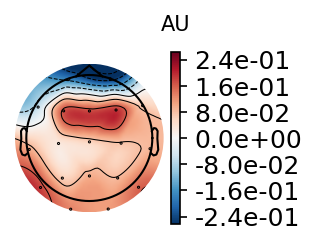

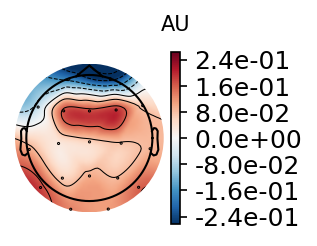

In [49]:
# Take theta power and alpha powers as an example
# Take the result of 0-0.5s

power.plot_topomap(tmin=0, tmax=0.5, fmin=4, fmax=8,
                   baseline=(-0.5, 0), mode='logratio')
power.plot_topomap(tmin=0, tmax=0.5, fmin=8, fmax=12,
                   baseline=(-0.5, 0), mode='logratio')

#### Plot joint figures

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


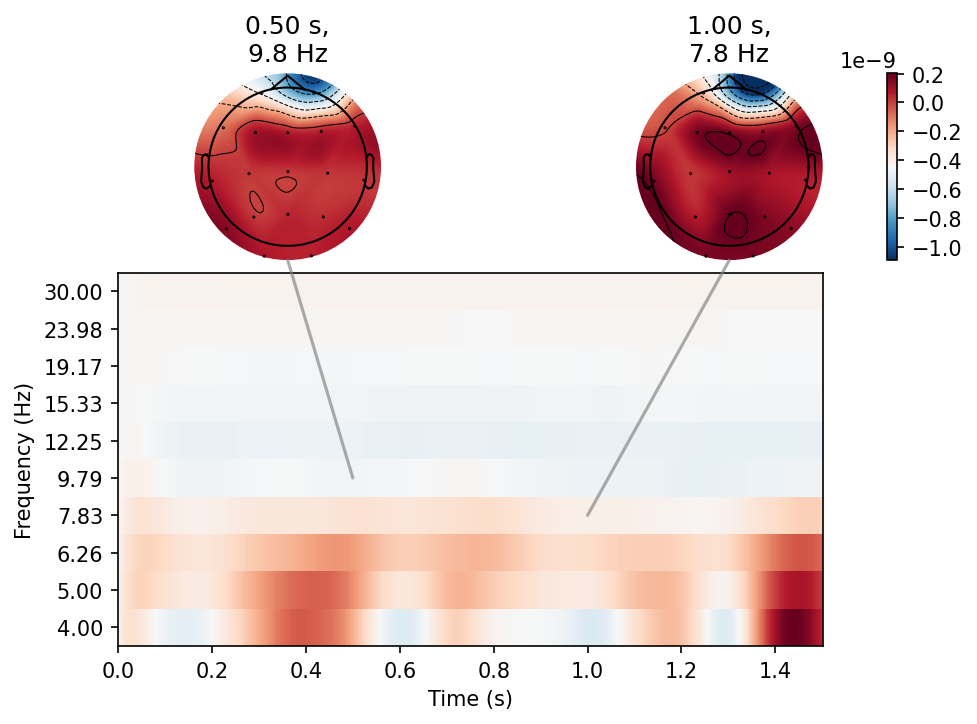

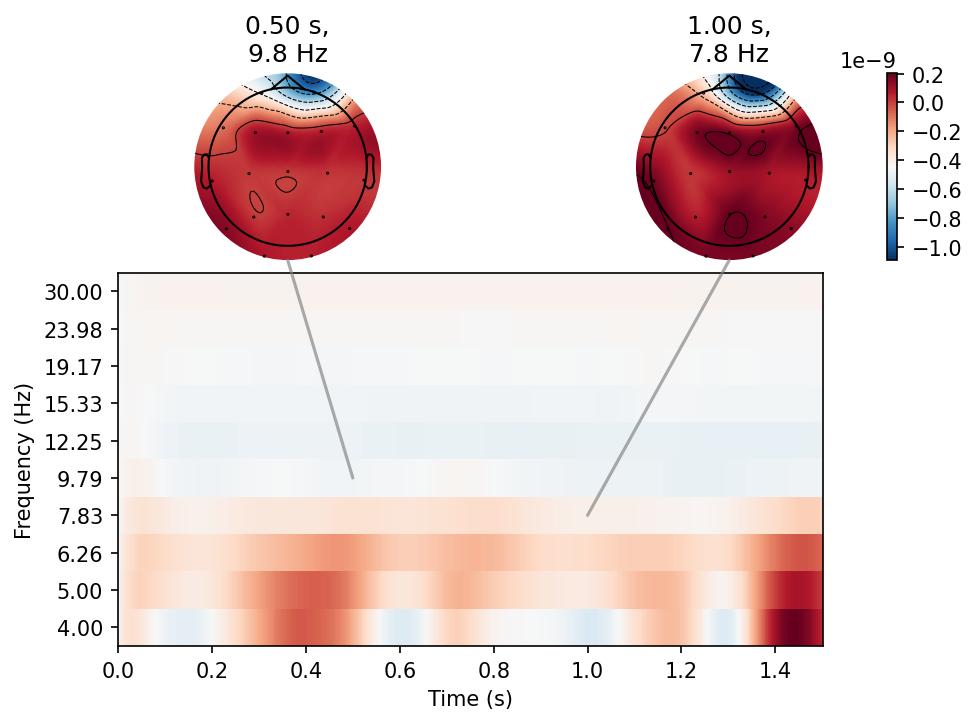

In [50]:
# And plot the results around 10Hz at 0.5s and around 8Hz at 1s
power.plot_joint(baseline=(-0.5, 0), mode='mean', tmin=-0.5, tmax=1.5,
                 timefreqs=[(0.5, 10), (1, 8)])

ITC results are plotted in similar ways. Below is an example of plotting ITC topology.

Applying baseline correction (mode: logratio)


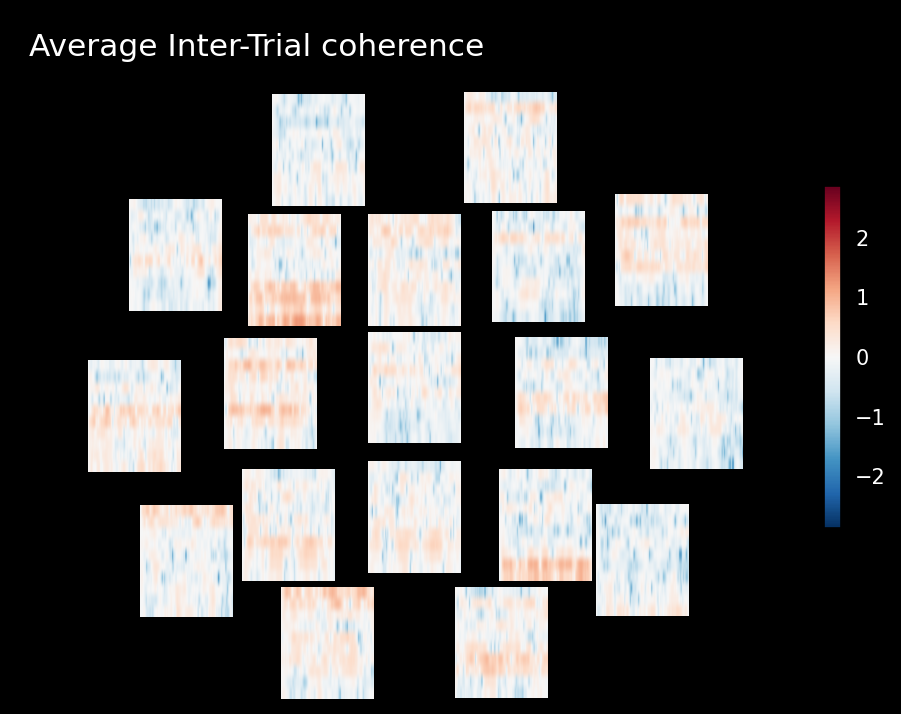

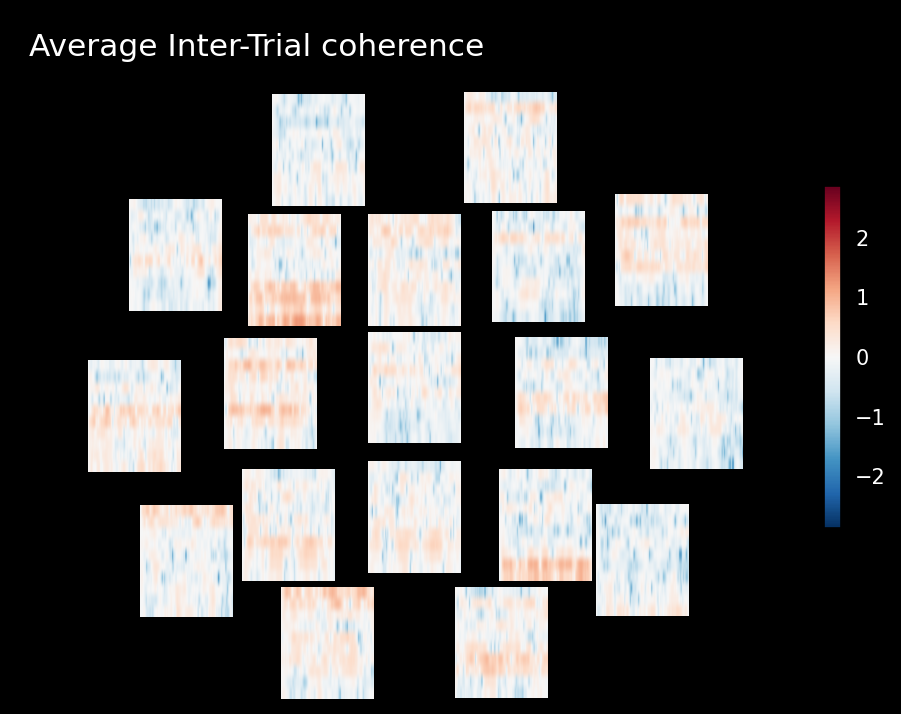

In [51]:
itc.plot_topo(baseline=(-0.5, 0), mode='logratio', title='Average Inter-Trial coherence')

### PSi

In [66]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

def hilbert_phase(signal):
    """计算信号的瞬时相位（弧度制）"""
    analytic_signal = hilbert(signal) # 希尔伯特变换
    phase = np.unwrap(np.angle(analytic_signal)) # 解卷绕相位
    return phase

def phase_sync_index(phase1, phase2, n=1, m=1):
    """计算相位同步指数 PSI (Phase Synchronization Index)"""
    # 计算相位差乘积的复指数
    phase_diff = n * phase1 - m * phase2
    complex_exp = np.exp(1j * phase_diff)
    
    # 时间平均（排除NaN值）
    valid_indices = ~np.isnan(complex_exp)
    if np.sum(valid_indices) == 0:
        return 0 # 若无有效数据，返回0
    psi = np.abs(np.mean(complex_exp[valid_indices]))
    return psi

# ================== 选择通道 ==================
channel_names = raw.ch_names
print("可用通道:", channel_names)

# 手动选择两个通道（例如 'Fp1' 和 'Fp2'）
selected_channels = ['Fp1', 'Fp2'] # 根据实际通道名称修改
if len(selected_channels) != 2:
 raise ValueError("请确保选择且仅选择两个通道！")

# 获取通道索引并提取数据
channel_indices = [raw.ch_names.index(ch) for ch in selected_channels]
data = raw.get_data(picks=channel_indices, verbose=False).T # 形状为 (n_channels, n_samples)

# ================== 预处理 ==================
sfreq = raw.info['sfreq'] # 采样率
times = raw.times # 时间轴

# 滤波（可选，去除噪声）
from mne.filter import filter_data
data_filtered = filter_data(data, sfreq, l_freq=1, h_freq=40, method='fir', fir_design='firwin')

# ================== 计算相位同步指数 ==================
phase_chan1 = hilbert_phase(data_filtered[:,0])
phase_chan2 = hilbert_phase(data_filtered[:,1])

psi = phase_sync_index(phase_chan1, phase_chan2)
print(f"Phase Synchronization Index (PSI): {psi:.4f}")



可用通道: ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T3', 'T4', 'T5', 'T6', 'Fz', 'Cz', 'Pz']
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (3.302 s)



C:\Users\sunge\AppData\Local\Temp\ipykernel_24944\1892083529.py:44: RuntimeWarning: filter_length (1651) is longer than the signal (2), distortion is likely. Reduce filter length or filter a longer signal.
  data_filtered = filter_data(data, sfreq, l_freq=1, h_freq=40, method='fir', fir_design='firwin')
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]

Phase Synchronization Index (PSI): 0.9646


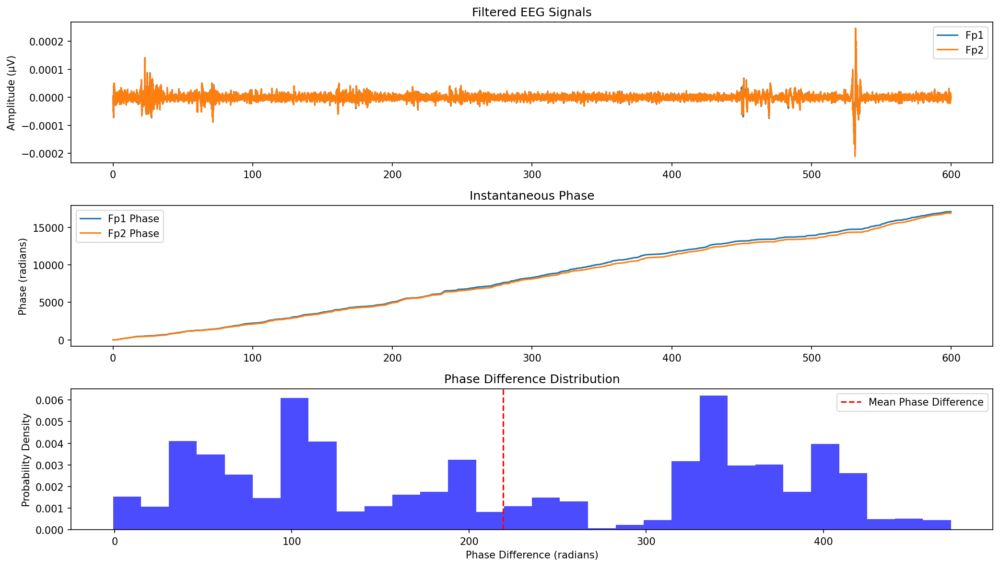

In [67]:
# ================== 可视化 ==================
plt.figure(figsize=(14, 8))

# 子图1：原始信号
plt.subplot(3, 1, 1)
plt.plot(times, data_filtered[:,0], label=selected_channels[0])
plt.plot(times, data_filtered[:,1], label=selected_channels[1])
plt.title("Filtered EEG Signals")
plt.ylabel("Amplitude (μV)")
plt.legend()

# 子图2：瞬时相位
plt.subplot(3, 1, 2)
plt.plot(times, phase_chan1, label=f"{selected_channels[0]} Phase")
plt.plot(times, phase_chan2, label=f"{selected_channels[1]} Phase")
plt.title("Instantaneous Phase")
plt.ylabel("Phase (radians)")
plt.legend()

# 子图3：相位差分布
phase_diff = phase_chan1 - phase_chan2
plt.subplot(3, 1, 3)
plt.hist(phase_diff, bins=30, density=True, alpha=0.7, color='blue')
plt.axvline(x=np.mean(phase_diff), color='red', linestyle='--', label="Mean Phase Difference")
plt.title("Phase Difference Distribution")
plt.xlabel("Phase Difference (radians)")
plt.ylabel("Probability Density")
plt.legend()

plt.tight_layout()
plt.show()